# Week 13 — Google Earth Engine & Cloud-Scale Time Series
## ARIA v9.0 — Completed Student Exercise Notebook (完成版學生練習筆記本)

**Course (課程):** Remote Sensing and Spatial Information Analysis and Applications
**Theme (主題):** Cloud-based satellite time-series analysis with Google Earth Engine
**Study Area (研究區域):** Hualien, Taiwan (花蓮) — Post-earthquake (2024/04/03) & landslide dam (堰塞湖) analysis
**Bounding Box:** `[121.2574, 23.6546, 121.4984, 23.7447]`

---

### Learning Objectives (學習目標)
1. Access and filter large satellite archives via GEE Python API
2. Compute NDVI time series and detect vegetation change after an earthquake
3. Integrate optical (Sentinel-2) and SAR (Sentinel-1) observations
4. Create pre/post composites and compute change maps
5. Export cloud-computed products for local analysis

### How to Use This Notebook (使用說明)
- This completed version has the exercise blanks filled in.
- Run cells **in order** from top to bottom.
- For first-time GEE use, authenticate before running the analysis cells.

### Prerequisites (先備知識)
- W8: NDVI fundamentals — W9: Change detection — W10: SAR basics — W12: Classification

> **Completed Student Exercise Notebook (完成版學生練習筆記本)** — ready for review and execution.

---
## S1 — Environment Setup (環境設定) ✅ COMPLETE

Install and import the required packages. We authenticate with Google Earth Engine,
set up Chinese font rendering for matplotlib, define our Area of Interest (AOI),
and run a quick connectivity test.

> **Note:** You need a GEE-enabled Google Cloud project. This completed version uses
> `EE_PROJECT` or `GOOGLE_CLOUD_PROJECT` when those environment variables are set;
> otherwise it tries your Earth Engine default credentials/project.

This cell is **complete** — just run it.

In [1]:
# ============================================================
# S1 — Environment Setup (環境設定) — COMPLETE
# ============================================================
import warnings
warnings.filterwarnings('ignore')

# --- Core imports ---
try:
    import ee
    import geemap
except ModuleNotFoundError as exc:
    raise ModuleNotFoundError(
        "Missing required GEE packages. Install them with: "
        "pip install earthengine-api geemap"
    ) from exc

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
from datetime import datetime, timedelta
import os, platform

# --- GEE Authentication & Initialization ---
# ee.Authenticate()  # Uncomment on first run — opens a browser auth flow
DEFAULT_GEE_PROJECT = 'helical-analogy-406703'
GEE_PROJECT = os.environ.get('EE_PROJECT') or os.environ.get('GOOGLE_CLOUD_PROJECT') or DEFAULT_GEE_PROJECT
try:
    if GEE_PROJECT:
        ee.Initialize(project=GEE_PROJECT)
        print(f"  GEE initialized with project: {GEE_PROJECT}")
    else:
        ee.Initialize()
        print("  GEE initialized with default credentials/project")
except Exception as exc:
    print("  GEE initialization failed.")
    print("  First run: uncomment ee.Authenticate(), complete browser login,")
    print("  then set EE_PROJECT or GOOGLE_CLOUD_PROJECT if Earth Engine requests a project.")
    raise

# --- Chinese font setup (跨平台中文字型) ---
from matplotlib import font_manager as fm

def setup_chinese_font():
    """Cross-platform Chinese font configuration."""
    system = platform.system()
    candidates = {
        'Windows': ['Microsoft JhengHei', 'Microsoft YaHei', 'SimHei'],
        'Darwin':  ['PingFang TC', 'Heiti TC', 'STHeiti'],
        'Linux':   ['Noto Sans CJK TC', 'WenQuanYi Micro Hei',
                    'AR PL UMing TW', 'Noto Sans TC']
    }
    available = {f.name for f in fm.fontManager.ttflist}
    for name in candidates.get(system, candidates['Linux']):
        if name in available:
            plt.rcParams['font.sans-serif'] = [name] + plt.rcParams['font.sans-serif']
            plt.rcParams['axes.unicode_minus'] = False
            print(f"  Chinese font set to: {name}")
            return name
    for flist in candidates.values():
        for name in flist:
            if name in available:
                plt.rcParams['font.sans-serif'] = [name] + plt.rcParams['font.sans-serif']
                plt.rcParams['axes.unicode_minus'] = False
                print(f"  Chinese font (fallback) set to: {name}")
                return name
    print("  WARNING: No CJK font found — Chinese text may not render correctly.")
    return None

font_name = setup_chinese_font()

# --- Define AOI (定義研究區域) ---
HUALIEN_BBOX = [121.2574, 23.6546, 121.4984, 23.7447]
aoi = ee.Geometry.Rectangle(HUALIEN_BBOX)

# --- Quick connectivity test (連線測試) ---
point = ee.Geometry.Point([121.37, 23.70])
elev = ee.Image('USGS/SRTMGL1_003').sample(point, 30).first().get('elevation').getInfo()
print(f"  Connectivity OK — Elevation at test point: {elev} m")

print()
print("=" * 60)
print("  S1 COMPLETE — Environment ready")
print(f"  AOI: {HUALIEN_BBOX}")
print(f"  Platform: {platform.system()} / Python {platform.python_version()}")
print("=" * 60)

  GEE initialized with project: helical-analogy-406703
  Chinese font set to: Microsoft JhengHei


  Connectivity OK — Elevation at test point: 1009 m

  S1 COMPLETE — Environment ready
  AOI: [121.2574, 23.6546, 121.4984, 23.7447]
  Platform: Windows / Python 3.13.9


---
## S2 — Filter Sentinel-2 ImageCollection (Sentinel-2 影像集篩選) ✏️ EXERCISE

We access the **Sentinel-2 Level-2A Surface Reflectance (Harmonized)** collection
and filter it by:
- **Date range (日期範圍):** 2020-01-01 to 2026-03-31
- **Cloud cover (雲量):** less than 40%
- **Spatial bounds (空間範圍):** our Hualien AOI

### Key GEE Concepts (關鍵概念)
- `ee.ImageCollection` — a stack of images managed on the server
- `filterDate(start, end)` — keep only images within a date range
- `filterBounds(geometry)` — keep only images that overlap our AOI
- `filter(ee.Filter.lt(property, value))` — filter by metadata property

> **HINT:** See Pre-lab Step 4 for ImageCollection filtering concepts.

In [2]:
# ============================================================
# S2 — Filter Sentinel-2 ImageCollection — EXERCISE COMPLETE
# ============================================================

S2_START = '2020-01-01'
S2_END_INCLUSIVE = '2026-03-31'
S2_END = '2026-04-01'  # GEE filterDate end is exclusive; this includes 2026-03-31.
MAX_CLOUD = 40

s2_col = (ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')
          .filterDate(S2_START, S2_END)
          .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', MAX_CLOUD))
          .filterBounds(aoi))

count = s2_col.size().getInfo()
print(f"  Total Sentinel-2 images ({S2_START} to {S2_END_INCLUSIVE}, cloud < {MAX_CLOUD}%): {count}")
if count == 0:
    raise ValueError("No Sentinel-2 images found. Check AOI, date range, and Earth Engine access.")

dates = s2_col.aggregate_array('system:time_start').getInfo()
dates_dt = [datetime.utcfromtimestamp(d / 1000) for d in dates]
print(f"  Date range: {min(dates_dt).strftime('%Y-%m-%d')} -> {max(dates_dt).strftime('%Y-%m-%d')}")

cloud_stats = s2_col.aggregate_stats('CLOUDY_PIXEL_PERCENTAGE').getInfo()
print(f"  Cloud cover — mean: {cloud_stats['mean']:.1f}%, "
      f"min: {cloud_stats['min']:.1f}%, max: {cloud_stats['max']:.1f}%")

first_img = s2_col.sort('system:time_start').first()
vis_rgb = {'bands': ['B4', 'B3', 'B2'], 'min': 0, 'max': 3000}

Map2 = geemap.Map(center=[23.70, 121.40], zoom=11)
Map2.addLayer(first_img.clip(aoi), vis_rgb, 'First S2 Image (RGB)')
Map2.addLayer(aoi, {'color': 'red'}, 'AOI — Hualien')
Map2

  Total Sentinel-2 images (2020-01-01 to 2026-03-31, cloud < 40%): 143


  Date range: 2020-01-11 -> 2026-03-30


  Cloud cover — mean: 20.7%, min: 0.0%, max: 39.5%


Map(center=[23.7, 121.4], controls=(WidgetControl(options=['position', 'transparent_bg'], position='topright',…

---
## S3 — NDVI Calculation + Cloud Masking (NDVI 計算與雲遮罩) ✏️ EXERCISE

Sentinel-2 Level-2A includes a **Scene Classification Layer (SCL)** band.
We use SCL to mask clouds, cloud shadows, snow, and other unwanted pixels.

| SCL Value | Class             | Keep? |
|-----------|-------------------|-------|
| 4         | Vegetation        | Yes   |
| 5         | Bare soil         | Yes   |
| 6         | Water             | Yes   |
| 7         | Unclassified      | Yes   |
| 3, 8, 9, 10, 11 | Cloud/shadow/snow | No |

**NDVI = (NIR - Red) / (NIR + Red) = (B8 - B4) / (B8 + B4)**

> **HINT:** B8 = NIR, B4 = Red — same as W8. The `normalizedDifference` function
> takes `['NIR_band', 'Red_band']` in that order.

In [3]:
# ============================================================
# S3 — NDVI Calculation + Cloud Masking — EXERCISE COMPLETE
# ============================================================

def mask_and_ndvi(image):
    """Apply SCL cloud mask and compute NDVI for a single S2 image."""
    scl = image.select('SCL')
    good_mask = (scl.eq(4).Or(scl.eq(5)).Or(scl.eq(6)).Or(scl.eq(7)))
    ndvi = image.normalizedDifference(['B8', 'B4']).rename('NDVI')

    return (image.addBands(ndvi)
            .updateMask(good_mask)
            .copyProperties(image, ['system:time_start']))

ndvi_col = s2_col.map(mask_and_ndvi)

sample_img = ndvi_col.sort('system:time_start').first()
vis_ndvi = {'bands': ['NDVI'], 'min': 0, 'max': 0.8,
            'palette': ['red', 'yellow', 'green', 'darkgreen']}

Map3 = geemap.Map(center=[23.70, 121.40], zoom=11)
Map3.addLayer(sample_img.select('NDVI').clip(aoi), vis_ndvi, 'Sample NDVI')
Map3.addLayer(aoi, {'color': 'red'}, 'AOI')
Map3

Map(center=[23.7, 121.4], controls=(WidgetControl(options=['position', 'transparent_bg'], position='topright',…

---
## S4 — Monthly NDVI Time Series with Spatial Spread (月均 NDVI 時間序列 + 空間分布) ✏️ EXERCISE

We aggregate NDVI to monthly medians, then retrieve **three spatial statistics**
over our AOI: the **mean** (regional average), **min** (worst pixel), and
**max** (best pixel).

### Why Three Lines Instead of One? (為什麼需要三條線？)

Imagine a classroom of 30 students taking an exam. If the class average is 75,
you might think "the class did OK." But what if the range is 20 to 100?
That tells a very different story — some students excelled, others struggled.

The same logic applies to satellite pixels:
- **Mean** = class average (overall health of the region)
- **Min** = lowest-scoring student (worst-damaged pixel — a landslide scar?)
- **Max** = top student (healthiest forest pixel — undamaged reference)

**Your tasks:**
1. Run the provided function to compute monthly mean/min/max
2. Create the matplotlib time series plot with a **shaded band** between min and max
3. Add the earthquake marker on 2024-04-03
4. Answer the guided scientific inquiry questions below

> The earthquake struck on **2024-04-03** — does the min value reveal damage
> signals that the mean alone might miss?


In [4]:
# ============================================================
# S4 — Monthly NDVI Time Series with Spatial Spread — EXERCISE COMPLETE
# ============================================================

# --- This function is COMPLETE — do not modify ---
def compute_monthly_ndvi(ndvi_collection, aoi, start_year=2020, end_year=2026):
    """Compute monthly NDVI statistics (mean, min, max) over an AOI.
    Returns a list of (date, mean, min, max) tuples.
    """
    results = []

    for year in range(start_year, end_year + 1):
        for month in range(1, 13):
            start = f'{year}-{month:02d}-01'
            if month == 12:
                end = f'{year + 1}-01-01'
            else:
                end = f'{year}-{month + 1:02d}-01'

            monthly = ndvi_collection.filterDate(start, end).select('NDVI')
            n = monthly.size().getInfo()

            if n == 0:
                results.append((datetime(year, month, 15), None, None, None))
                continue

            median_img = monthly.median()
            stats = median_img.reduceRegion(
                reducer=ee.Reducer.mean()
                    .combine(ee.Reducer.min(), sharedInputs=True)
                    .combine(ee.Reducer.max(), sharedInputs=True),
                geometry=aoi,
                scale=100,
                maxPixels=1e8
            ).getInfo()

            v_mean = stats.get('NDVI_mean')
            v_min  = stats.get('NDVI_min')
            v_max  = stats.get('NDVI_max')
            results.append((datetime(year, month, 15), v_mean, v_min, v_max))

            if v_mean is not None:
                print(f'  {start[:7]}: mean={v_mean:.3f}  min={v_min:.3f}  '
                      f'max={v_max:.3f}  (n={n})')
            else:
                print(f'  {start[:7]}: no data  (n={n})')

    return results

print('Computing monthly NDVI with spatial statistics...')
print('(mean = regional average, min = worst pixel, max = best pixel)')
print()
monthly_data = compute_monthly_ndvi(ndvi_col, aoi)

# --- Prepare data for plotting (do not modify) ---
dates_plot  = [d for d, m, mn, mx in monthly_data if m is not None]
mean_plot   = [m for d, m, mn, mx in monthly_data if m is not None]
min_plot    = [mn for d, m, mn, mx in monthly_data if m is not None]
max_plot    = [mx for d, m, mn, mx in monthly_data if m is not None]


Computing monthly NDVI with spatial statistics...
(mean = regional average, min = worst pixel, max = best pixel)



  2020-01: mean=0.706  min=-0.355  max=0.997  (n=3)


  2020-02: mean=0.695  min=-0.231  max=0.922  (n=2)


  2020-03: mean=0.630  min=-0.041  max=0.895  (n=1)


  2020-04: mean=0.659  min=-0.070  max=0.900  (n=1)


  2020-05: mean=0.639  min=-0.112  max=0.951  (n=2)


  2020-06: mean=0.752  min=-0.159  max=0.955  (n=3)


  2020-07: mean=0.709  min=-0.069  max=0.941  (n=2)


  2020-08: mean=0.716  min=-0.100  max=0.940  (n=2)


  2020-09: mean=0.635  min=-0.057  max=0.926  (n=2)


  2020-10: mean=0.698  min=-0.131  max=0.933  (n=2)


  2020-11: mean=0.755  min=-0.229  max=0.954  (n=3)


  2020-12: mean=0.698  min=-0.133  max=0.935  (n=1)


  2021-01: mean=0.711  min=-0.149  max=0.996  (n=3)


  2021-02: mean=0.625  min=-0.081  max=0.891  (n=3)


  2021-03: mean=0.692  min=-0.094  max=0.921  (n=3)


  2021-04: mean=0.724  min=-0.129  max=0.964  (n=2)


  2021-05: mean=0.716  min=-0.115  max=0.993  (n=3)


  2021-07: mean=0.734  min=-0.207  max=0.955  (n=3)


  2021-08: mean=0.671  min=-0.103  max=0.933  (n=1)


  2021-09: mean=0.699  min=-0.136  max=0.957  (n=5)


  2021-10: mean=0.574  min=-0.077  max=0.881  (n=1)


  2021-11: mean=0.694  min=-0.371  max=0.967  (n=4)


  2021-12: mean=0.697  min=-0.290  max=0.999  (n=2)


  2022-03: mean=0.723  min=-0.159  max=0.937  (n=2)


  2022-04: mean=0.687  min=-0.237  max=0.973  (n=2)


  2022-05: mean=0.728  min=-0.143  max=1.000  (n=1)


  2022-06: mean=0.673  min=-0.187  max=0.981  (n=1)


  2022-07: mean=0.746  min=-0.167  max=0.989  (n=4)


  2022-08: mean=0.726  min=-0.115  max=0.969  (n=2)


  2022-09: mean=0.768  min=-0.068  max=0.963  (n=2)


  2022-10: mean=0.742  min=-0.202  max=0.935  (n=2)


  2022-11: mean=0.703  min=-0.398  max=0.966  (n=1)


  2022-12: mean=0.723  min=-0.142  max=0.924  (n=2)


  2023-02: mean=0.537  min=-0.054  max=0.890  (n=1)


  2023-03: mean=0.697  min=-0.057  max=0.929  (n=3)


  2023-04: mean=0.637  min=-0.123  max=0.920  (n=1)


  2023-05: mean=0.696  min=-0.104  max=1.000  (n=1)


  2023-06: mean=0.680  min=-0.119  max=1.000  (n=2)


  2023-07: mean=0.747  min=-0.139  max=0.959  (n=2)


  2023-08: mean=0.697  min=-0.156  max=0.949  (n=1)


  2023-09: mean=0.719  min=-0.203  max=0.944  (n=2)


  2023-10: mean=0.694  min=-0.080  max=0.906  (n=1)


  2023-11: mean=0.635  min=-0.195  max=0.918  (n=2)


  2024-01: mean=0.706  min=-0.059  max=0.982  (n=3)


  2024-02: mean=0.717  min=-0.034  max=0.913  (n=1)


  2024-03: mean=0.663  min=-0.148  max=0.921  (n=2)


  2024-04: mean=0.618  min=-0.058  max=1.000  (n=3)


  2024-06: mean=0.685  min=-0.120  max=0.929  (n=1)


  2024-07: mean=0.746  min=-0.139  max=0.979  (n=4)


  2024-08: mean=0.754  min=-0.174  max=0.960  (n=4)


  2024-09: mean=0.725  min=-0.197  max=0.947  (n=3)


  2024-10: mean=0.701  min=-0.178  max=0.944  (n=1)


  2024-11: mean=0.607  min=-0.170  max=0.907  (n=2)


  2024-12: mean=0.691  min=-0.345  max=0.926  (n=1)


  2025-01: mean=0.707  min=-0.101  max=0.986  (n=1)


  2025-02: mean=0.673  min=-0.260  max=0.936  (n=1)


  2025-03: mean=0.713  min=-0.336  max=0.958  (n=1)


  2025-04: mean=0.697  min=-0.227  max=0.928  (n=3)


  2025-06: mean=0.754  min=-0.164  max=0.979  (n=2)


  2025-07: mean=0.637  min=-0.221  max=0.977  (n=2)


  2025-08: mean=0.663  min=-0.415  max=0.945  (n=4)


  2025-09: mean=0.671  min=-0.586  max=0.986  (n=4)


  2025-10: mean=0.666  min=-0.311  max=0.941  (n=5)


  2025-12: mean=0.632  min=-0.310  max=0.946  (n=1)


  2026-01: mean=0.622  min=-0.324  max=0.934  (n=3)


  2026-03: mean=0.645  min=-0.851  max=0.931  (n=2)


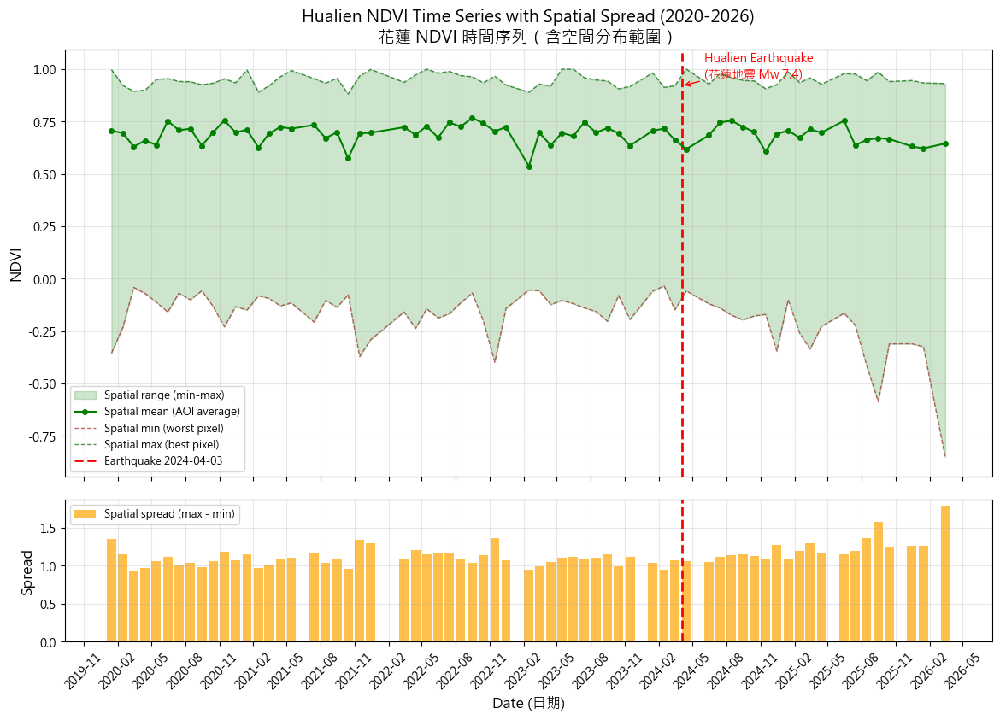

  Pre-earthquake  avg spread: 1.0936
  Post-earthquake avg spread: 1.2264


In [5]:
# ============================================================
# S4 (continued) — Plot NDVI Time Series with Spread — EXERCISE COMPLETE
# ============================================================

if not dates_plot:
    raise ValueError("No valid monthly NDVI values to plot. Run S2-S4 and check the AOI/data filters.")

fig, axes = plt.subplots(2, 1, figsize=(14, 9), height_ratios=[3, 1],
                         sharex=True, gridspec_kw={'hspace': 0.08})

ax = axes[0]
ax.fill_between(dates_plot, min_plot, max_plot,
                alpha=0.2, color='green', label='Spatial range (min-max)')

ax.plot(dates_plot, mean_plot, 'o-', color='green', markersize=4, linewidth=1.5,
        label='Spatial mean (AOI average)', zorder=3)
ax.plot(dates_plot, min_plot, '--', color='brown', linewidth=1, alpha=0.7,
        label='Spatial min (worst pixel)')
ax.plot(dates_plot, max_plot, '--', color='darkgreen', linewidth=1, alpha=0.7,
        label='Spatial max (best pixel)')

eq_date = datetime(2024, 4, 3)
ax.axvline(eq_date, color='red', linestyle='--', linewidth=2,
           label='Earthquake 2024-04-03')
ax.annotate('Hualien Earthquake\n(花蓮地震 Mw 7.4)',
            xy=(eq_date, max(max_plot) * 0.92),
            xytext=(eq_date + timedelta(days=60), max(max_plot) * 0.96),
            fontsize=10, color='red',
            arrowprops=dict(arrowstyle='->', color='red'))

ax.set_ylabel('NDVI', fontsize=12)
ax.set_title('Hualien NDVI Time Series with Spatial Spread (2020-2026)\n'
             '花蓮 NDVI 時間序列（含空間分布範圍）', fontsize=14)
ax.legend(loc='lower left', fontsize=9)
ax.grid(True, alpha=0.3)

ax2 = axes[1]
spread_plot = [mx - mn for mn, mx in zip(min_plot, max_plot)]
ax2.bar(dates_plot, spread_plot, width=25, color='orange', alpha=0.7,
        label='Spatial spread (max - min)')
ax2.axvline(eq_date, color='red', linestyle='--', linewidth=2)
ax2.set_ylabel('Spread', fontsize=12)
ax2.set_xlabel('Date (日期)', fontsize=12)
ax2.legend(loc='upper left', fontsize=9)
ax2.grid(True, alpha=0.3)
ax2.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

pre_spreads = [mx - mn for d, m, mn, mx in monthly_data
               if m is not None and d < eq_date]
post_spreads = [mx - mn for d, m, mn, mx in monthly_data
                if m is not None and d >= eq_date]
if pre_spreads and post_spreads:
    print(f'  Pre-earthquake  avg spread: {sum(pre_spreads)/len(pre_spreads):.4f}')
    print(f'  Post-earthquake avg spread: {sum(post_spreads)/len(post_spreads):.4f}')

### S4 — Scientific Inquiry: From Data to Discovery (科學探究：從數據到發現)

好的科學家不會只把資料畫成圖 —— 他們會**質疑資料到底在告訴我們什麼**。以下討論結合三線 NDVI 圖的視覺證據,以及筆記本實際輸出的數值來解讀。

---

**Q1: Observe (觀察) — Describe the three lines:**
- Does the mean (green) show a clear earthquake signal? Why or why not?
- Does the min (brown) show a different story? What happens to it after 2024-04?
- Does the max (dark green) change much after the earthquake?

> *討論：* 平均 NDVI 線在 2024-04-03 地震後**並沒有**出現劇烈的單步驟下跌。這是可以預期的,因為寬幅花蓮 AOI 混合了山區、河谷、平原、都市與農地,以及大量未受損的植生像元,局部的崩塌訊號因此被廣大穩定的背景稀釋。在寬幅 AOI 的比較中,平均值只從震前約 **0.6929** 變到震後約 **0.6803**(約 **−0.0126**),這個幅度小到會被正常的季節變化、雲遮罩差異與地表覆蓋混合所掩蓋。
>
> **最小值 NDVI** 線對局部擾動更敏感:它從震前約 **−0.1463** 掉到震後約 **−0.2744**(約 **−0.1281**),代表最低 NDVI 的像元在震後明顯變差。這些低值與裸露土壤、崩塌疤痕、河道泥砂、道路面或殘留陰影一致。**最大值 NDVI** 線變化很小,因為最健康的森林像元仍維持翠綠。三條線合起來顯示:地震並未造成整個區域均勻褐化,而是在一個整體仍有植生的地景中,產生**局部的低 NDVI 損害**。

---

**Q2: Question (質疑方法論) — Why does the mean miss the signal?**

Our AOI is approximately 24 km x 10 km. If earthquake landslides cover
5 km^2 of this area, what percentage of pixels are damaged? Would the
mean NDVI shift noticeably? What does this tell you about choosing the
**right spatial scale** for analysis?

> *討論：* AOI 大約 **24 km × 10 km = 240 km²**。若崩塌覆蓋 **5 km²**,受損比例為 **5 / 240 = 0.0208**,只佔 AOI 約 **2.1%**。即使這些像元損失大量植生,整個 AOI 的平均值仍由其餘 **97.9%** 的像元主導。舉例來說,若 2.1% 的像元 NDVI 各下降 0.5、其餘像元不變,平均值也只下降約 **0.0105**,與正常的時間序列雜訊相當。
>
> 這說明了空間尺度為何重要。區域平均值適合做大範圍初篩,但對局部災害是個很弱的統計量。崩塌發生在坡面單元、道路切坡、谷壁與河岸邊緣;要偵測它們,分析需要聚焦的 AOI、低百分位或最小值統計、以及像元尺度的變化圖,而不是只依賴單一平均值。

---

**Q3: Interpret the spread (解讀展幅) — Look at the orange bar chart:**
- Did the spread (max - min) change after the earthquake?
- What does an increase in spread mean physically? (Think: what happens to a
  landscape when some areas collapse into landslides while nearby forests are fine?)

> *討論：* **有 —— 展幅在地震後變寬了。** 筆記本本身的輸出顯示,平均的「最大值−最小值」展幅在 2024-04-03 之前約為 **1.0936**、之後約為 **1.2264**,增加了大約 **+0.13(約 +12%)**。下方的橘色長條圖也呈現同樣的趨勢:震後的長條平均而言更高。
>
> 從物理意義上,展幅(max − min)衡量的是**空間異質性** —— 也就是最好與最差像元之間的差距有多大。崩塌災害會使展幅變寬,因為地景同時分裂成兩種族群:未受損的坡面與森林斑塊維持翠綠(高 NDVI),而新生的崩塌疤痕、裸露土壤、被泥砂覆蓋的河道與道路切坡則掉到低值或負值 NDVI。兩種極端同時存在於同一個 AOI 內。
>
> 因此,一個幾乎穩定的平均值**加上**變寬的展幅,絕不能解讀成「沒有災害」。這正是**不均勻、局部化**損害的指紋:平均值把兩種族群平均回去、掩蓋了疤痕,而展幅(以及最小值線)則揭露出 AOI 在震後確實變得更加混雜。

---

**Q4: Design the next experiment (設計下一步實驗):**

If you wanted to find **exactly where** the worst-damaged pixels are,
what would you do next? (Hint: think about what S5 does, or how you might
use a smaller AOI focused on known landslide areas.)

> *討論：* 下一步是從時間序列的摘要統計量,進到**像元尺度的變化偵測**。我會建立一張震前中值 NDVI 合成影像與一張震後中值 NDVI 合成影像,接著計算 **ΔNDVI = 震後 NDVI − 震前 NDVI**。強烈負值的像元(例如 **ΔNDVI < −0.15**)可以標示為植生損失或崩塌疤痕的候選區 —— 這正是 S5 所使用的邏輯。
>
> 我也會在聚焦的災害 AOI 重複這個分析,例如太魯閣峽谷、蘇花公路廊帶、陡峭河谷與已知崩塌區。接著再疊合坡度、高程、道路、聚落、河系、降雨、以及現地/無人機證據。目標是從「指標變化了」進一步推進到「這些是應該優先勘查的地點」。

---

**Q5: Connect to the real world (連結真實世界):**

Imagine you work for the Soil and Water Conservation Bureau (水土保持局).
After a major earthquake, you need to quickly identify which mountain roads
and villages are at risk from landslides. Based on what you've learned:
- Would you use mean NDVI or min NDVI to prioritize rescue efforts? Why?
- How would you combine optical (NDVI) and SAR data for a cloudy area like Hualien?
- What other data would you want? (Elevation? Slope? Population density?)

> *討論：* 我不會只用平均 NDVI 來做緊急應變的優先排序,因為它對局部的山區災害太過稀釋。我會使用低百分位/最小值 NDVI、ΔNDVI 地圖、以及聚焦的 AOI 來找出可疑的損害區。不過,只靠光學的 NDVI 應視為**候選圖層而非最終證據**,因為雲影、季節性植生、河道泥砂、農業或工程開挖也都會使 NDVI 下降。
>
> 對花蓮,我會把 Sentinel-2 光學證據與 Sentinel-1 SAR 結合。NDVI 偵測植生損失與新生裸露面,而 SAR 能穿透雲層觀測,並可能對地表粗糙度、含水量與坡面幾何的變化有反應。**ΔNDVI 與 ΔVV 同時強烈變化**的區域,值得列為較高優先的現地勘查對象。在實務操作上,我還會再加入 DEM 衍生的坡度/坡向、地質、降雨、排水網、道路、橋梁、聚落、人口暴露度、歷史崩塌目錄、無人機影像與現地報告。

---

> **科學方法的流程：** 觀察異常 → 質疑方法論 → 精煉分析 → 形成假設 → 加以檢驗
>
> 在這裡,平均值看起來幾乎穩定,但最小值線與空間展幅暗示了局部擾動。這正是後面各段落的動機:聚焦 AOI 測試、像元尺度 ΔNDVI 地圖、SAR 比對、匯出,以及 GIF/數值地圖視覺化。

---
## S4b — Scale Test: Taroko Gorge vs Broad Hualien (尺度測試：太魯閣 vs 寬幅花蓮) ✏️ EXERCISE

You just analyzed NDVI across a broad AOI (~240 km²) that includes flatlands,
wetlands, and mountains. But the 2024 earthquake damage was concentrated in the
**Taroko Gorge** — steep mountain slopes where landslides buried roads and trails.

**Hypothesis:** If we focus on the mountain damage corridor, the NDVI drop will be much clearer.

**Your task:** Run the same `compute_monthly_ndvi` function on a different AOI
focused on the steep Taroko mountain corridor and compare the results side-by-side.

| AOI | Area | What's Inside |
|-----|------|---------------|
| Broad Hualien | ~240 km² | Plains, wetlands, city, mountains |
| Taroko Focus | ~1,780 km² | Taroko Gorge, Suhua Hwy, mountain slopes |

> **Note (尺度 vs 範圍):** "Focused" here means *centered on the relevant terrain*
> (steep mountains only — no city or plains), **not** physically smaller. The Taroko
> box is actually the larger of the two. The lesson of S4b is that *which landscape*
> you average over matters as much as *how big* the AOI is.


  Taroko Sentinel-2 images (2020-01-01 to 2026-03-31, cloud < 40%): 291


  AOI area — Broad Hualien: 246 km2  |  Taroko Focus: 1,779 km2
Computing monthly NDVI for Taroko Gorge focused AOI...
Taroko BBOX: [121.34526379253053, 24.046021742135874, 121.85149217685861, 24.35767637905926]



  2020-01: mean=0.458  min=-0.534  max=0.999  (n=8)


  2020-02: mean=0.461  min=-0.585  max=0.995  (n=4)


  2020-03: mean=0.430  min=-0.470  max=0.984  (n=5)


  2020-04: mean=0.481  min=-0.208  max=0.937  (n=2)


  2020-05: mean=0.435  min=-0.408  max=0.964  (n=4)


  2020-06: mean=0.544  min=-0.551  max=0.949  (n=5)


  2020-07: mean=0.527  min=-0.373  max=0.940  (n=5)


  2020-08: mean=0.508  min=-0.815  max=0.981  (n=4)


  2020-09: mean=0.491  min=-0.407  max=0.958  (n=5)


  2020-10: mean=0.482  min=-0.613  max=0.983  (n=3)


  2020-11: mean=0.498  min=-0.521  max=0.998  (n=5)


  2020-12: mean=0.349  min=-0.782  max=0.998  (n=2)


  2021-01: mean=0.494  min=-0.604  max=1.000  (n=6)


  2021-02: mean=0.428  min=-0.563  max=0.992  (n=6)


  2021-03: mean=0.480  min=-0.442  max=0.969  (n=6)


  2021-04: mean=0.470  min=-0.494  max=0.993  (n=4)


  2021-05: mean=0.519  min=-0.275  max=0.997  (n=5)


  2021-06: mean=0.673  min=-0.195  max=0.911  (n=2)


  2021-07: mean=0.531  min=-0.437  max=0.966  (n=6)


  2021-08: mean=0.485  min=-0.971  max=0.998  (n=3)


  2021-09: mean=0.464  min=-0.944  max=0.969  (n=10)


  2021-10: mean=0.351  min=-0.551  max=0.972  (n=3)


  2021-11: mean=0.428  min=-0.921  max=0.997  (n=8)


  2021-12: mean=0.466  min=-0.649  max=0.999  (n=4)


  2022-03: mean=0.478  min=-0.842  max=1.000  (n=4)


  2022-04: mean=0.480  min=-0.444  max=0.958  (n=3)


  2022-05: mean=0.632  min=-0.701  max=1.000  (n=1)


  2022-06: mean=0.531  min=-0.226  max=0.996  (n=2)


  2022-07: mean=0.555  min=-0.222  max=0.956  (n=7)


  2022-08: mean=0.530  min=-0.581  max=1.000  (n=5)


  2022-09: mean=0.519  min=-1.000  max=1.000  (n=5)


  2022-10: mean=0.513  min=-0.826  max=1.000  (n=4)


  2022-11: mean=0.326  min=-0.956  max=1.000  (n=2)


  2022-12: mean=0.478  min=-0.591  max=1.000  (n=3)


  2023-01: mean=0.663  min=-0.330  max=1.000  (n=1)


  2023-02: mean=0.434  min=-0.546  max=0.915  (n=1)


  2023-03: mean=0.502  min=-0.604  max=0.936  (n=6)


  2023-04: mean=0.505  min=-0.408  max=0.933  (n=2)


  2023-05: mean=0.487  min=-0.300  max=1.000  (n=3)


  2023-06: mean=0.428  min=-1.000  max=1.000  (n=3)


  2023-07: mean=0.541  min=-0.390  max=0.951  (n=5)


  2023-08: mean=0.331  min=-1.000  max=0.955  (n=3)


  2023-09: mean=0.488  min=-1.000  max=0.964  (n=4)


  2023-10: mean=0.486  min=-1.000  max=0.993  (n=2)


  2023-11: mean=0.357  min=-1.000  max=1.000  (n=4)


  2023-12: mean=0.617  min=-0.560  max=1.000  (n=3)


  2024-01: mean=0.468  min=-0.629  max=1.000  (n=4)


  2024-02: mean=0.498  min=-0.608  max=1.000  (n=3)


  2024-03: mean=0.469  min=-1.000  max=0.957  (n=5)


  2024-04: mean=0.479  min=-1.000  max=0.929  (n=4)


  2024-06: mean=0.441  min=-0.411  max=0.921  (n=2)


  2024-07: mean=0.524  min=-0.252  max=0.960  (n=7)


  2024-08: mean=0.514  min=-1.000  max=0.954  (n=8)


  2024-09: mean=0.450  min=-0.489  max=1.000  (n=7)


  2024-10: mean=0.212  min=-1.000  max=0.937  (n=1)


  2024-11: mean=0.367  min=-0.653  max=0.933  (n=2)


  2024-12: mean=0.389  min=-0.754  max=0.959  (n=1)


  2025-01: mean=0.471  min=-0.690  max=1.000  (n=2)


  2025-02: mean=0.457  min=-0.611  max=0.966  (n=2)


  2025-03: mean=0.515  min=-0.551  max=1.000  (n=3)


  2025-04: mean=0.501  min=-0.576  max=0.949  (n=6)


  2025-05: mean=0.709  min=-0.381  max=0.925  (n=1)


  2025-06: mean=0.513  min=-1.000  max=1.000  (n=4)


  2025-07: mean=0.325  min=-0.525  max=1.000  (n=3)


  2025-08: mean=0.509  min=-0.561  max=0.962  (n=8)


  2025-09: mean=0.488  min=-1.000  max=1.000  (n=6)


  2025-10: mean=0.507  min=-0.945  max=1.000  (n=9)


  2025-11: mean=0.687  min=-0.595  max=0.985  (n=1)


  2025-12: mean=0.388  min=-0.809  max=1.000  (n=2)


  2026-01: mean=0.469  min=-0.528  max=1.000  (n=7)


  2026-02: mean=0.610  min=-0.384  max=1.000  (n=1)


  2026-03: mean=0.504  min=-0.917  max=1.000  (n=4)


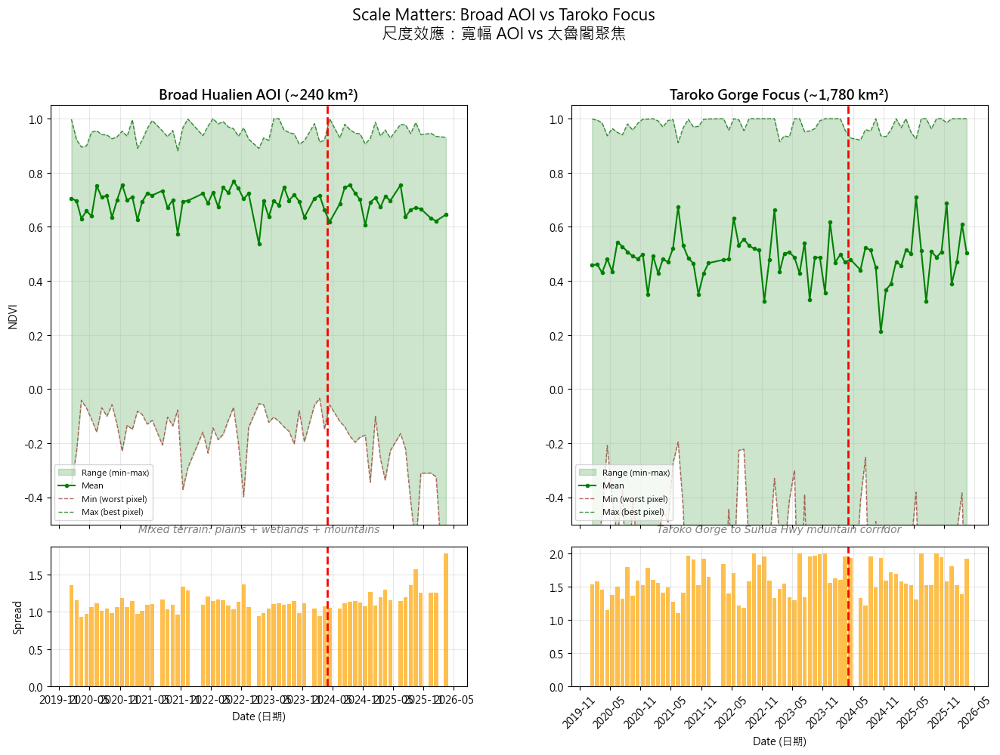


  Broad Hualien:
    Mean  — pre: 0.6929  post: 0.6803  change: -0.0126
    Min   — pre: -0.1463  post: -0.2744  change: -0.1281

  Taroko Focus:
    Mean  — pre: 0.4851  post: 0.4795  change: -0.0056
    Min   — pre: -0.6138  post: -0.6797  change: -0.0659


In [6]:
# ============================================================
# S4b — Taroko Gorge Focused Analysis — EXERCISE COMPLETE
# ============================================================

TAROKO_BBOX = [121.34526379253053, 24.046021742135874,
               121.85149217685861, 24.35767637905926]
aoi_taroko = ee.Geometry.Rectangle(TAROKO_BBOX)

taroko_s2_col = (ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')
                 .filterDate(S2_START, S2_END)
                 .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', MAX_CLOUD))
                 .filterBounds(aoi_taroko))
taroko_count = taroko_s2_col.size().getInfo()
print(f'  Taroko Sentinel-2 images ({S2_START} to {S2_END_INCLUSIVE}, cloud < {MAX_CLOUD}%): {taroko_count}')
if taroko_count == 0:
    raise ValueError("No Sentinel-2 images found for the Taroko focused AOI.")

# Verify AOI extents (GEE-computed geodesic area).
# "Focused" = centred on mountain terrain, NOT physically smaller:
# the Taroko box is actually the larger of the two AOIs.
broad_area_km2  = aoi.area(maxError=1).getInfo() / 1e6
taroko_area_km2 = aoi_taroko.area(maxError=1).getInfo() / 1e6
print(f'  AOI area — Broad Hualien: {broad_area_km2:,.0f} km2  |  '
      f'Taroko Focus: {taroko_area_km2:,.0f} km2')

taroko_ndvi_col = taroko_s2_col.map(mask_and_ndvi)

print('Computing monthly NDVI for Taroko Gorge focused AOI...')
print(f'Taroko BBOX: {TAROKO_BBOX}')
print()
taroko_data = compute_monthly_ndvi(taroko_ndvi_col, aoi_taroko)

t_dates = [d for d, m, mn, mx in taroko_data if m is not None]
t_mean  = [m for d, m, mn, mx in taroko_data if m is not None]
t_min   = [mn for d, m, mn, mx in taroko_data if m is not None]
t_max   = [mx for d, m, mn, mx in taroko_data if m is not None]

fig, axes = plt.subplots(2, 2, figsize=(16, 10),
                         height_ratios=[3, 1],
                         sharex=True,
                         gridspec_kw={'hspace': 0.08, 'wspace': 0.25})

eq_date = datetime(2024, 4, 3)

for col, (title, dates, means, mins, maxs, desc) in enumerate([
    ('Broad Hualien AOI (~240 km\u00b2)',
     dates_plot, mean_plot, min_plot, max_plot,
     'Mixed terrain: plains + wetlands + mountains'),
    ('Taroko Gorge Focus (~1,780 km²)',
     t_dates, t_mean, t_min, t_max,
     'Taroko Gorge to Suhua Hwy mountain corridor'),
]):
    ax = axes[0, col]
    ax.fill_between(dates, mins, maxs,
                    alpha=0.2, color='green', label='Range (min-max)')

    ax.plot(dates, means, 'o-', color='green', markersize=3,
            linewidth=1.5, label='Mean', zorder=3)
    ax.plot(dates, mins, '--', color='brown', linewidth=1,
            alpha=0.7, label='Min (worst pixel)')
    ax.plot(dates, maxs, '--', color='darkgreen', linewidth=1,
            alpha=0.7, label='Max (best pixel)')
    ax.axvline(eq_date, color='red', linestyle='--', linewidth=2)
    ax.set_title(title, fontsize=13, fontweight='bold')
    ax.set_ylabel('NDVI' if col == 0 else '')
    ax.legend(fontsize=8, loc='lower left')
    ax.grid(True, alpha=0.3)
    ax.text(0.5, -0.02, desc, transform=ax.transAxes,
            ha='center', fontsize=10, color='gray', style='italic')
    ax.set_ylim(-0.5, 1.05)

    ax2 = axes[1, col]
    spreads = [mx - mn for mn, mx in zip(mins, maxs)]
    ax2.bar(dates, spreads, width=25, color='orange', alpha=0.7)
    ax2.axvline(eq_date, color='red', linestyle='--', linewidth=2)
    ax2.set_ylabel('Spread' if col == 0 else '')
    ax2.grid(True, alpha=0.3)

for ax in axes[1, :]:
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    ax.set_xlabel('Date (日期)')

fig.suptitle('Scale Matters: Broad AOI vs Taroko Focus\n'
             '尺度效應：寬幅 AOI vs 太魯閣聚焦', fontsize=15, y=1.01)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

for label, data in [('Broad Hualien', monthly_data), ('Taroko Focus', taroko_data)]:
    pre  = [(d, m, mn, mx) for d, m, mn, mx in data
            if m is not None and d < eq_date]
    post = [(d, m, mn, mx) for d, m, mn, mx in data
            if m is not None and d >= eq_date]
    if pre and post:
        pre_mean = sum(m for _, m, _, _ in pre) / len(pre)
        post_mean = sum(m for _, m, _, _ in post) / len(post)
        pre_min_avg = sum(mn for _, _, mn, _ in pre) / len(pre)
        post_min_avg = sum(mn for _, _, mn, _ in post) / len(post)
        print(f'\n  {label}:')
        print(f'    Mean  — pre: {pre_mean:.4f}  post: {post_mean:.4f}  '
              f'change: {post_mean-pre_mean:+.4f}')
        print(f'    Min   — pre: {pre_min_avg:.4f}  post: {post_min_avg:.4f}  '
              f'change: {post_min_avg-pre_min_avg:+.4f}')

### S4b — Your Analysis (你的分析)

**Q1: Compare the two panels.** Which AOI shows a clearer earthquake damage signal?
Look at the mean line, the min line, and the spread — which changed more dramatically
in the Taroko focus?

> *討論：* 只看 **AOI 摘要統計量**的話,兩張圖都沒有出現劇烈的地震階梯 —— 而且出乎意料的是,聚焦的 AOI **並沒有**贏過寬幅的。寬幅花蓮 AOI 的變化為 **平均 −0.0126 / 最小值 −0.1281**;太魯閣聚焦的變化為 **平均 −0.0056 / 最小值 −0.0659**。太魯閣的平均值甚至更平,而它的最小值實際上比寬幅 AOI 掉得**還少**。
>
> 這並不是方法失敗 —— 這正是 S4b 真正要傳達的課題。太魯閣框約 1,780 km²,裡面仍含有大量非植生地表(峽谷陰影、裸岩、水體、海岸線)。它的震前最小值本來就已經極度負值(約 −0.61),幾乎沒有再往下掉的「空間」;而它的平均值則被廣大穩定的陡坡森林撐住。一個只是「以山區為中心」、卻仍混入大量非崩塌像元的邊界框,一樣會產生被稀釋的 AOI 平均值。
>
> 所以誠實的比較是:**在兩個案例中,AOI 平均值線都很弱。** 聚焦真正換來的不是更好的*平均值*,而是更好的*地圖*。在像元尺度(S5 / S5b 的 ΔNDVI 地圖),陡峭的山區廊帶能讓個別的崩塌疤痕與裸露坡面被直接看見,而以低地為主的寬幅 AOI 則會把它們平均掉。災害訊號存在於**空間樣態與分布下尾**,而不在單一的平均數字裡 —— 這正是 S4「質疑你的統計量」的課題,如今在第二個尺度上再次得到驗證。

**Q2: Why does scale matter?** If a government agency analyzed the entire Hualien
county and concluded "vegetation impact was minimal," would that be accurate?
What would you recommend they do differently?

> *討論：* 像「植生影響輕微」這種全縣尺度的說法,如果只是指 NDVI 平均值,在數學上也許成立,但對災害應變而言會造成誤導。崩塌可能只佔全縣很小的面積百分比,卻仍然摧毀道路、阻斷河川、孤立社區並形成堰塞湖。**面積百分比與人命風險並不是同一回事。**
>
> 我會建議採用**階層式的工作流程**:先用大範圍掃描找出候選的異常;接著放大到與災害相關的區域,例如太魯閣峽谷、蘇花公路、陡峭河谷與已通報的崩塌;最後再製作像元尺度的 ΔNDVI 與 SAR 變化圖。最終的決策圖層,應依暴露度來排序地點,包括道路、聚落、橋梁、河道與人口。

**Q3: Hierarchical analysis.** Real disaster monitoring uses three levels:
1. Broad scan (country/county) -> detect anomalies
2. Focused zoom (valley/slope) -> pinpoint damage
3. Pixel-level mapping -> individual landslide scars

You just performed levels 1 and 2. Which section of this notebook performs level 3?

> *討論：* **S5** 執行第三層:它建立震前/震後的中值 NDVI 合成影像並相減,產生像元尺度的 ΔNDVI 地圖。S5 問的不是「整個 AOI 的平均有沒有變」,而是「**每一個像元**變得更綠還是更不綠」。**S5b** 接著把這些像元尺度的結果繪成數值地圖與三期 GIF 動畫,讓損害與復原的空間樣態更容易檢視。**S7** 則進一步強化第三層分析:它把光學的 ΔNDVI 損害與 Sentinel-1 SAR 的 ΔVV 變化取交集,在兩個獨立感測器一致同意之處,產生一個保守的高信心損害圖層。

> **核心重點：** 同一份衛星資料,在不同尺度下會說出不同的故事。區域平均值回答「整個地區有沒有變?」、聚焦 AOI 回答「災害區是否異常?」、像元地圖回答「我們該優先勘查哪裡?」。

---
## S5 — Three-Phase Composite Comparison (三期中值合成比較) ✏️ EXERCISE

The 2024 earthquake triggered landslides that created **landslide dams** (堰塞湖),
including the Mataian landslide dam (馬太鞍堰塞湖). To track this multi-event
disaster timeline, we compare three periods:

| Phase | Period | What Happened |
|-------|--------|---------------|
| **Phase 1** | 2023/01 – 2024/03 | Pre-earthquake baseline |
| **Phase 2** | 2024/04 – 2024/09 | Post-earthquake: landslides, road collapse |
| **Phase 3** | 2025/10 – 2026/03 | Post-landslide-dam: breach aftermath |

> **HINT:** Use `.filterDate('start', 'end').select('NDVI').median()` for each phase.


In [7]:
# ============================================================
# S5 — Three-Phase Composite Comparison — EXERCISE COMPLETE
# ============================================================

# GEE filterDate uses an exclusive end date, so each *_END below is one day
# after the stated period end in the course table.
PHASE_PRE_START = '2023-01-01'
PHASE_PRE_END = '2024-04-01'       # includes 2024-03-31
PHASE_POST_EQ_START = '2024-04-01'
PHASE_POST_EQ_END = '2024-10-01'   # includes 2024-09-30
PHASE_POST_DAM_START = '2025-10-01'
PHASE_POST_DAM_END = '2026-04-01'  # includes 2026-03-31

pre_ndvi = (ndvi_col
            .filterDate(PHASE_PRE_START, PHASE_PRE_END)
            .select('NDVI')
            .median())

post_eq_ndvi = (ndvi_col
                .filterDate(PHASE_POST_EQ_START, PHASE_POST_EQ_END)
                .select('NDVI')
                .median())

post_dam_ndvi = (ndvi_col
                 .filterDate(PHASE_POST_DAM_START, PHASE_POST_DAM_END)
                 .select('NDVI')
                 .median())

delta_eq    = post_eq_ndvi.subtract(pre_ndvi).rename('delta_NDVI')
delta_dam   = post_dam_ndvi.subtract(post_eq_ndvi).rename('delta_NDVI_dam')
delta_total = post_dam_ndvi.subtract(pre_ndvi).rename('delta_NDVI_total')

vis_ndvi  = {'min': 0, 'max': 0.8,
             'palette': ['red', 'yellow', 'green', 'darkgreen']}
vis_delta = {'min': -0.3, 'max': 0.3,
             'palette': ['red', 'white', 'blue']}

Map5 = geemap.Map(center=[23.70, 121.40], zoom=11)
Map5.addLayer(pre_ndvi.clip(aoi), vis_ndvi, 'Phase 1: Pre-EQ')
Map5.addLayer(post_eq_ndvi.clip(aoi), vis_ndvi, 'Phase 2: Post-EQ')
Map5.addLayer(post_dam_ndvi.clip(aoi), vis_ndvi, 'Phase 3: Post-Dam')
Map5.addLayer(delta_eq.clip(aoi), vis_delta, 'ΔNDVI: EQ damage (P2-P1)')
Map5.addLayer(delta_dam.clip(aoi), vis_delta, 'ΔNDVI: Dam change (P3-P2)')
Map5.addLayer(delta_total.clip(aoi), vis_delta, 'ΔNDVI: Total (P3-P1)')
Map5.addLayer(aoi, {'color': 'yellow'}, 'AOI')
Map5

Map(center=[23.7, 121.4], controls=(WidgetControl(options=['position', 'transparent_bg'], position='topright',…

### S5 Visual — 三期衛星影像對比 ✏️ EXERCISE

用 geemap 在互動地圖上展示三期的 RGB 真色合成和 NDVI 合成。

**觀察任務：**
1. 在 RGB 地圖上，找到太魯閣峽谷附近最明顯的崩塌區（Phase 1 綠 → Phase 2 灰白）
2. 在 ΔNDVI 地圖上，比較三張差值圖的紅色（損失）和綠色（恢復）分佈
3. 堰塞湖潰堤後是否造成新損害？還是已有部分恢復？

In [8]:
# ============================================================
# S5 Visual — Three-Phase Map Comparison — EXERCISE COMPLETE
# ============================================================

try:
    s2_visual_col = taroko_s2_col
    visual_aoi = aoi_taroko
    visual_center = [24.20, 121.60]
    visual_label = 'Taroko Focus AOI'
except NameError:
    s2_visual_col = s2_col
    visual_aoi = aoi
    visual_center = [23.70, 121.40]
    visual_label = 'Main Hualien AOI'

s2_masked = s2_visual_col.map(lambda img: img.updateMask(
    img.select('SCL').eq(4).Or(img.select('SCL').eq(5))
    .Or(img.select('SCL').eq(6)).Or(img.select('SCL').eq(7))
))

rgb_pre = (s2_masked.filterDate(PHASE_PRE_START, PHASE_PRE_END)
           .median().select(['B4', 'B3', 'B2']).clip(visual_aoi))
rgb_post_eq = (s2_masked.filterDate(PHASE_POST_EQ_START, PHASE_POST_EQ_END)
               .median().select(['B4', 'B3', 'B2']).clip(visual_aoi))
rgb_post_dam = (s2_masked.filterDate(PHASE_POST_DAM_START, PHASE_POST_DAM_END)
                .median().select(['B4', 'B3', 'B2']).clip(visual_aoi))

rgb_vis = {'min': 0, 'max': 3000}
ndvi_vis = {'min': 0, 'max': 0.8, 'palette': ['brown', 'yellow', 'green', 'darkgreen']}
delta_vis = {'min': -0.3, 'max': 0.3, 'palette': ['red', 'orange', 'white', 'lightgreen', 'darkgreen']}

Map1 = geemap.Map(center=visual_center, zoom=11)
Map1.addLayer(rgb_pre, rgb_vis, 'Phase 1: Pre-EQ RGB')
Map1.addLayer(rgb_post_eq, rgb_vis, 'Phase 2: Post-EQ RGB')
Map1.addLayer(rgb_post_dam, rgb_vis, 'Phase 3: Post-Dam RGB')
Map1.addLayer(visual_aoi, {'color': 'yellow'}, visual_label)
Map1.addLayerControl()
Map1

Map(center=[24.2, 121.6], controls=(WidgetControl(options=['position', 'transparent_bg'], position='topright',…

In [9]:
# === Map 2: NDVI + Delta Maps ===

if 'ndvi_vis' not in globals():
    ndvi_vis = {'min': 0, 'max': 0.8, 'palette': ['brown', 'yellow', 'green', 'darkgreen']}
if 'delta_vis' not in globals():
    delta_vis = {'min': -0.3, 'max': 0.3, 'palette': ['red', 'orange', 'white', 'lightgreen', 'darkgreen']}


try:
    ndvi_visual_col = taroko_ndvi_col
    visual_aoi = aoi_taroko
    visual_center = [24.20, 121.60]
    visual_label = 'Taroko Focus AOI'
except NameError:
    ndvi_visual_col = ndvi_col
    visual_aoi = aoi
    visual_center = [23.70, 121.40]
    visual_label = 'Main Hualien AOI'

pre_ndvi_visual = (ndvi_visual_col.filterDate(PHASE_PRE_START, PHASE_PRE_END)
                   .select('NDVI').median())
post_eq_ndvi_visual = (ndvi_visual_col.filterDate(PHASE_POST_EQ_START, PHASE_POST_EQ_END)
                       .select('NDVI').median())
post_dam_ndvi_visual = (ndvi_visual_col.filterDate(PHASE_POST_DAM_START, PHASE_POST_DAM_END)
                        .select('NDVI').median())

delta_eq_visual = post_eq_ndvi_visual.subtract(pre_ndvi_visual).rename('delta_NDVI')
delta_dam_visual = post_dam_ndvi_visual.subtract(post_eq_ndvi_visual).rename('delta_NDVI_dam')
delta_total_visual = post_dam_ndvi_visual.subtract(pre_ndvi_visual).rename('delta_NDVI_total')

Map2 = geemap.Map(center=visual_center, zoom=11)
Map2.addLayer(pre_ndvi_visual.clip(visual_aoi), ndvi_vis, 'Phase 1: Pre-EQ NDVI', shown=False)
Map2.addLayer(post_eq_ndvi_visual.clip(visual_aoi), ndvi_vis, 'Phase 2: Post-EQ NDVI', shown=True)
Map2.addLayer(post_dam_ndvi_visual.clip(visual_aoi), ndvi_vis, 'Phase 3: Post-Dam NDVI', shown=False)
Map2.addLayer(delta_eq_visual.clip(visual_aoi), delta_vis, 'ΔNDVI: EQ damage (P2-P1)', shown=True)
Map2.addLayer(delta_dam_visual.clip(visual_aoi), delta_vis, 'ΔNDVI: Dam change (P3-P2)', shown=False)
Map2.addLayer(delta_total_visual.clip(visual_aoi), delta_vis, 'ΔNDVI: Total (P3-P1)', shown=False)
Map2.addLayer(visual_aoi, {'color': 'yellow'}, visual_label)
Map2.addLayerControl()
Map2

Map(center=[24.2, 121.6], controls=(WidgetControl(options=['position', 'transparent_bg'], position='topright',…

**✏️ 觀察紀錄：S5 三期 ΔNDVI 地圖討論**

1. 地震直接損害（`delta_eq = Phase 2 - Phase 1`）主要集中在哪些地形？（峽谷？稜線？河谷？）

   **仔細觀察與解釋：** 震後直接損害的紅色區應優先出現在陡峭峽谷兩側、稜線下方的崩塌坡面、道路切坡、河谷邊坡，以及裸露岩土或新崩塌堆積的位置。這些地形共同特徵是坡度大、地形破碎、震動放大與重力不穩定性高，所以在地震後更容易從高 NDVI 植被轉為低 NDVI 裸露面。  

   從本 notebook 的主要 Hualien AOI 統計來看，`delta_eq` 的平均值為 **+0.0272**，但 `ΔNDVI < -0.15` 的損害面積仍有 **約 4.12 km²**。這代表地震造成的負向變化在寬幅 AOI 中是**局部但明確**的；平均值沒有變負，並不表示沒有災害，而是因為其他未受損或季節性變綠的像元抵消了局部崩塌訊號。

2. 堰塞湖潰堤後（`delta_dam = Phase 3 - Phase 2`），是出現新損害還是植被恢復？分佈在哪裡？

   **仔細觀察與解釋：** `delta_dam` 可以同時呈現兩種現象：綠色代表部分早期裸露坡面或 disturbed vegetation 正在恢復；紅色則可能代表後續豪雨、河道沖刷、堰塞湖相關泥砂擾動、道路工程裸露面，或舊崩塌擴大。就本次統計結果而言，`delta_dam` 的平均 ΔNDVI 為 **-0.0911**，標準差 **0.1706**，且 `ΔNDVI < -0.15` 的面積達 **約 40.17 km²**，比 `delta_eq` 更大。  

   因此，在這個 AOI 裡，Phase 3 相對 Phase 2 並不是單純恢復，而是出現更廣泛的負向變化。空間上應特別注意河道、沖積扇、崩塌下游、舊裸露坡面周邊、道路沿線與排水集中的地方。不過，Phase 3 距離地震已有一段時間，結果也可能混合季節差異、雲遮罩殘留、土地利用變化與後續降雨事件，所以解讀時不能把所有紅色都直接歸因於堰塞湖本身。

3. 如果你是水土保持局工程師，這三張 ΔNDVI 地圖分別幫你做什麼決策？

   **決策用途：** `delta_eq` 適合用來判斷地震立即造成的崩塌熱區，協助震後初期巡查、道路封閉、航照/UAV 任務規劃與危險邊坡初篩。`delta_dam` 適合追蹤後續事件，例如堰塞湖、豪雨、河道沖刷或工程擾動是否造成新的植被損失，也可檢查哪些早期災區正在恢復。`delta_total = Phase 3 - Phase 1` 則適合評估累積影響，統計結果顯示平均 ΔNDVI 為 **-0.0638**，累積負向變化面積約 **32.71 km²**，可用於長期治理、復育優先順序、保全對象排序與災後監測報告。  

   實務上，我不會只用 ΔNDVI 做最後判斷，而會把這三張圖與坡度、地質、降雨、道路、村落、河道、歷史崩塌目錄和 SAR 變化圖疊合。這樣才能從「光譜變化」提升到「災害風險決策」。


In [10]:
# --- Three-phase statistics (do not modify) ---
for label, delta_img, band_name in [
    ('EQ damage (Phase 2 - Phase 1)',    delta_eq,    'delta_NDVI'),
    ('Dam change (Phase 3 - Phase 2)',   delta_dam,   'delta_NDVI_dam'),
    ('Total change (Phase 3 - Phase 1)', delta_total, 'delta_NDVI_total'),
]:
    stats = delta_img.reduceRegion(
        reducer=ee.Reducer.mean()
            .combine(ee.Reducer.stdDev(), sharedInputs=True),
        geometry=aoi, scale=100, maxPixels=1e8
    ).getInfo()
    mean_v = stats.get(f'{band_name}_mean')
    std_v  = stats.get(f'{band_name}_stdDev')
    damage = delta_img.lt(-0.15)
    area = damage.multiply(ee.Image.pixelArea()).reduceRegion(
        reducer=ee.Reducer.sum(), geometry=aoi,
        scale=100, maxPixels=1e8
    ).getInfo()
    area_km2 = (area.get(band_name, 0) or 0) / 1e6
    print(f'\n  {label}:')
    if mean_v: print(f'    Mean ΔNDVI:  {mean_v:+.4f}')
    if std_v:  print(f'    StdDev:      {std_v:.4f}')
    print(f'    Damaged area (ΔNDVI < -0.15): {area_km2:.2f} km2')

# Keep reference for S7
delta_ndvi = delta_eq



  EQ damage (Phase 2 - Phase 1):
    Mean ΔNDVI:  +0.0272
    StdDev:      0.0688
    Damaged area (ΔNDVI < -0.15): 4.12 km2



  Dam change (Phase 3 - Phase 2):
    Mean ΔNDVI:  -0.0911
    StdDev:      0.1706
    Damaged area (ΔNDVI < -0.15): 40.17 km2



  Total change (Phase 3 - Phase 1):
    Mean ΔNDVI:  -0.0638
    StdDev:      0.1664
    Damaged area (ΔNDVI < -0.15): 32.71 km2


---
## S5b — Remote Sensing Value Maps + GIF (遙測數值圖與動畫)

老師示範的成果不只包含折線圖，也可以把 GEE 計算出的遙測指標直接輸出成「數值地圖」與 GIF。這裡用同一組三期 Sentinel-2 NDVI composite 產出：

- **NDVI value maps:** 震前、震後、堰塞湖/後期三期中值合成圖，數值範圍 0–0.8。
- **ΔNDVI value maps:** Phase 2 - Phase 1、Phase 3 - Phase 2、Phase 3 - Phase 1，數值範圍 -0.3–0.3。
- **GIF animation:** 用三期影像快速檢查植被變化與負向變化區是否集中在山區、河谷與崩塌帶。

> 重點：這些是 raster value maps，不只是統計折線。紅色代表 NDVI 下降，綠色代表 NDVI 增加或恢復。

S5b: pulling three-phase NDVI / delta-NDVI rasters from GEE ...


  done - raster grid (196, 289) @ 180 m


S5b: wrote 05/06 value-map PNGs, 07/08 GIF animations, and 12 gif_frames/.


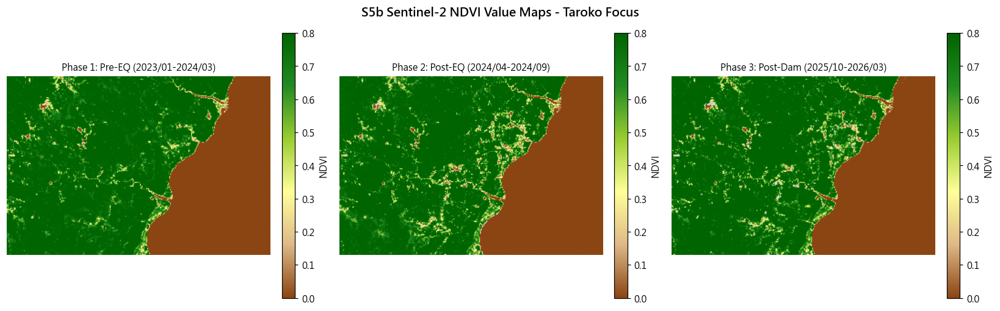

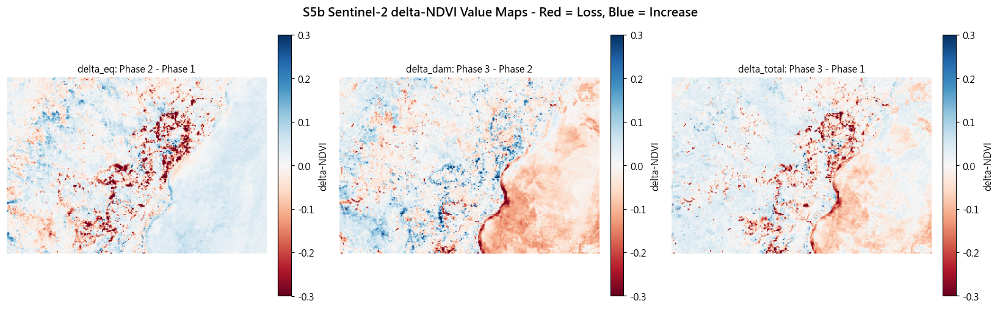

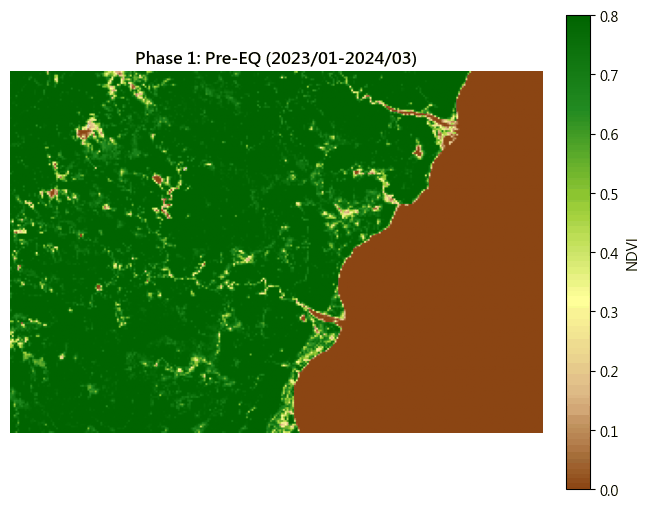

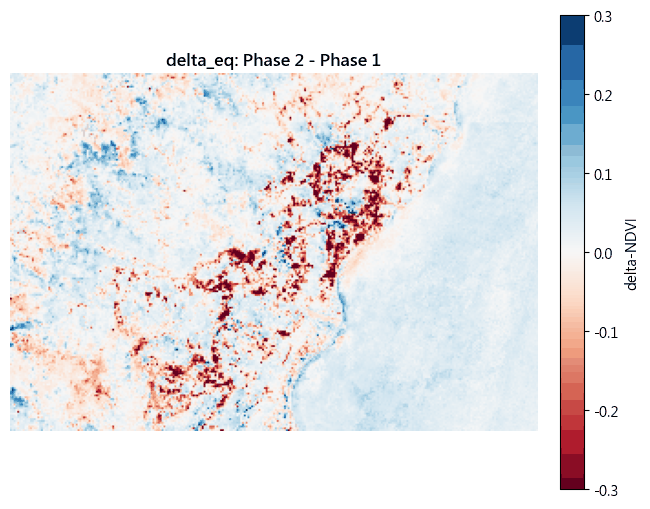

In [11]:
# ============================================================
# S5b — Value Maps + GIF Animation — REPRODUCIBLE
# ============================================================
# This cell *computes* the value maps and GIFs from the S5 Visual three-phase
# composites (Taroko focus) and writes them to Week13_outputs/. Re-running the
# notebook regenerates every asset — nothing is hard-coded or pre-baked.

import os
from PIL import Image as PILImage
from matplotlib.colors import LinearSegmentedColormap
from IPython.display import Image as IPyImage, display

OUT_DIR   = 'Week13_outputs'
FRAME_DIR = os.path.join(OUT_DIR, 'gif_frames')
os.makedirs(FRAME_DIR, exist_ok=True)
S5B_SCALE = 180  # m — overview resolution for the value maps

def ee_image_to_array(img, region, scale=S5B_SCALE, fill=-9.0):
    """Pull one GEE image band into a numpy array; masked pixels -> NaN.
    Reproject to a coarse grid first so sampleRectangle stays under its
    262,144-pixel limit."""
    rect = (img.select([0]).rename('val').toFloat()
               .reproject(crs='EPSG:32651', scale=scale)
               .sampleRectangle(region=region, defaultValue=fill))
    arr = np.array(rect.get('val').getInfo(), dtype=float)
    arr[arr == fill] = np.nan
    return arr

# --- 1. Pull the three-phase composites (Taroko focus, reused from S5 Visual) ---
print('S5b: pulling three-phase NDVI / delta-NDVI rasters from GEE ...')
ndvi_layers = [
    ('phase1', 'Phase 1: Pre-EQ (2023/01-2024/03)',  pre_ndvi_visual),
    ('phase2', 'Phase 2: Post-EQ (2024/04-2024/09)',  post_eq_ndvi_visual),
    ('phase3', 'Phase 3: Post-Dam (2025/10-2026/03)', post_dam_ndvi_visual),
]
delta_layers = [
    ('delta_eq',    'delta_eq: Phase 2 - Phase 1',    delta_eq_visual),
    ('delta_dam',   'delta_dam: Phase 3 - Phase 2',   delta_dam_visual),
    ('delta_total', 'delta_total: Phase 3 - Phase 1', delta_total_visual),
]
ndvi_arrays  = [(k, t, ee_image_to_array(img, visual_aoi)) for k, t, img in ndvi_layers]
delta_arrays = [(k, t, ee_image_to_array(img, visual_aoi)) for k, t, img in delta_layers]
print(f'  done - raster grid {ndvi_arrays[0][2].shape} @ {S5B_SCALE} m')

# --- 2. Colormaps (brown->green for NDVI, red/blue for change) ---
ndvi_cmap = LinearSegmentedColormap.from_list(
    'ndvi', ['#8B4513', '#DEB887', '#FFFF99', '#9ACD32', '#228B22', '#006400'])
ndvi_cmap.set_bad('lightgray')
delta_cmap = plt.get_cmap('RdBu').copy()   # red = NDVI loss, blue = NDVI gain
delta_cmap.set_bad('lightgray')

# --- 3. Static value-map panels (05, 06) ---
def panel_figure(arrays, cmap, vmin, vmax, clabel, suptitle, path):
    fig, axes = plt.subplots(1, 3, figsize=(15, 4.6))
    for ax, (key, title, arr) in zip(axes, arrays):
        im = ax.imshow(arr, cmap=cmap, vmin=vmin, vmax=vmax)
        ax.set_title(title, fontsize=10)
        ax.axis('off')
        plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label=clabel)
    fig.suptitle(suptitle, fontsize=13, fontweight='bold')
    fig.tight_layout()
    fig.savefig(path, dpi=110, bbox_inches='tight')
    plt.close(fig)

panel_figure(ndvi_arrays, ndvi_cmap, 0.0, 0.8, 'NDVI',
             'S5b Sentinel-2 NDVI Value Maps - Taroko Focus',
             f'{OUT_DIR}/05_s5b_ndvi_phase_value_maps.png')
panel_figure(delta_arrays, delta_cmap, -0.3, 0.3, 'delta-NDVI',
             'S5b Sentinel-2 delta-NDVI Value Maps - Red = Loss, Blue = Increase',
             f'{OUT_DIR}/06_s5b_delta_ndvi_value_maps.png')

# --- 4. Per-phase frames (raw + annotated) for the GIFs ---
def save_frames(arrays, cmap, vmin, vmax, clabel):
    for key, title, arr in arrays:
        for kind in ('raw', 'annotated'):
            fig, ax = plt.subplots(figsize=(6.6, 5.2))
            im = ax.imshow(arr, cmap=cmap, vmin=vmin, vmax=vmax)
            ax.axis('off')
            if kind == 'annotated':
                ax.set_title(title, fontsize=12, fontweight='bold')
                plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label=clabel)
            fig.tight_layout()
            fig.savefig(f'{FRAME_DIR}/{key}_{kind}.png', dpi=100, bbox_inches='tight')
            plt.close(fig)

save_frames(ndvi_arrays,  ndvi_cmap,  0.0,  0.8, 'NDVI')
save_frames(delta_arrays, delta_cmap, -0.3, 0.3, 'delta-NDVI')

# --- 5. Assemble GIF animations (07, 08) from the annotated frames ---
def build_gif(arrays, out_path, duration=1100):
    frames = [PILImage.open(f'{FRAME_DIR}/{key}_annotated.png').convert('RGB')
              for key, _, _ in arrays]
    w = min(f.width for f in frames)
    h = min(f.height for f in frames)
    frames = [f.resize((w, h)) for f in frames]
    frames[0].save(out_path, save_all=True, append_images=frames[1:],
                   duration=duration, loop=0)

build_gif(ndvi_arrays,  f'{OUT_DIR}/07_s5b_ndvi_three_phase.gif')
build_gif(delta_arrays, f'{OUT_DIR}/08_s5b_delta_ndvi_animation.gif')
print('S5b: wrote 05/06 value-map PNGs, 07/08 GIF animations, and 12 gif_frames/.')

# --- 6. Display the four products inline ---
for fn in ['05_s5b_ndvi_phase_value_maps.png', '06_s5b_delta_ndvi_value_maps.png',
           '07_s5b_ndvi_three_phase.gif', '08_s5b_delta_ndvi_animation.gif']:
    display(IPyImage(filename=f'{OUT_DIR}/{fn}'))


### S5b — Observation (數值地圖與動畫的判讀)

對照上面的數值地圖與 GIF：

1. **NDVI 三期圖（05 / 07）：** 山區多維持高 NDVI（深綠），海洋與裸露地為棕色。
   逐期比較時，注意峽谷兩側、河道與道路切坡是否出現綠轉黃/棕的退化像元。
2. **ΔNDVI 三期圖（06 / 08）：** 紅色為 NDVI 下降（植被損失或新裸露），藍色為
   上升（復原或季節增綠）。`delta_eq` 反映地震直接損害、`delta_dam` 反映堰塞湖
   /後期事件、`delta_total` 為累積變化。
3. **為何要看數值地圖？** S4 的折線圖只給「區域平均」，會稀釋局部訊號；數值地圖
   保留每個像元的空間位置，能直接指出*哪裡*受損 —— 這正是 S4 科學探究所說的
   下一步：從統計回到空間。


---
## S6 — Sentinel-1 SAR GRD Time Series (Sentinel-1 SAR 時間序列) ✏️ EXERCISE

Synthetic Aperture Radar (SAR) is **cloud-independent** — it penetrates clouds and
works day/night. This is critical for Hualien, which has frequent cloud cover.

We use **Sentinel-1 GRD** (Ground Range Detected) data:
- **IW mode** (Interferometric Wide swath) — standard land observation mode
- **VV polarization** — sensitive to surface roughness changes
- Values are in **decibels (dB)** — logarithmic scale

> **HINT:** The instrument mode is called `'IW'` and we want the `'VV'` band.

In [12]:
# ============================================================
# S6 — Sentinel-1 SAR GRD Time Series — EXERCISE COMPLETE
# ============================================================

s1_col = (ee.ImageCollection('COPERNICUS/S1_GRD')
          .filterDate('2022-01-01', S2_END)
          .filter(ee.Filter.eq('instrumentMode', 'IW'))
          .filter(ee.Filter.eq('orbitProperties_pass', 'DESCENDING'))
          .filter(ee.Filter.listContains('transmitterReceiverPolarisation', 'VV'))
          .filterBounds(aoi)
          .select('VV'))

s1_count = s1_col.size().getInfo()
print(f"  Sentinel-1 GRD images (2022-2026, DESC, VV): {s1_count}")
if s1_count == 0:
    raise ValueError("No Sentinel-1 images found. Check AOI/date/orbit filters.")

  Sentinel-1 GRD images (2022-2026, DESC, VV): 147


  Valid observations: 147


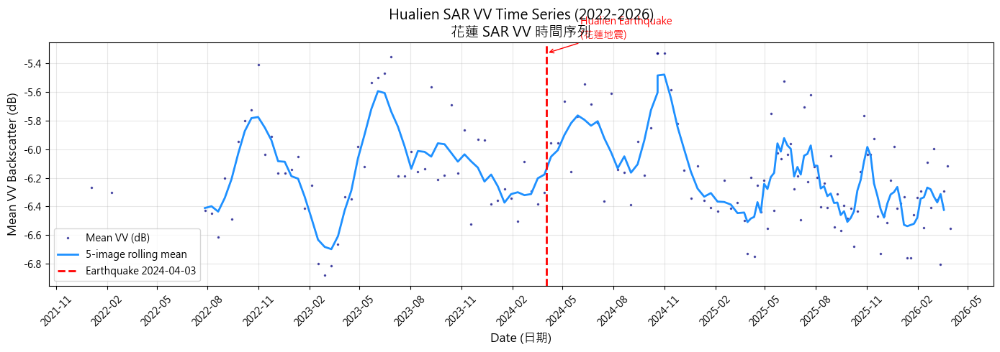

In [13]:
# ============================================================
# S6 (continued) — SAR Time Series Extraction & Plot — COMPLETE
# ============================================================

def get_vv_stats(image):
    """Extract mean VV over AOI for a single image."""
    stats = image.reduceRegion(
        reducer=ee.Reducer.mean(),
        geometry=aoi,
        scale=100,
        maxPixels=1e8
    )
    return image.set('mean_VV', stats.get('VV'))

s1_with_stats = s1_col.map(get_vv_stats)

s1_info = s1_with_stats.aggregate_array('system:time_start').getInfo()
s1_vv = s1_with_stats.aggregate_array('mean_VV').getInfo()

s1_dates = [datetime.utcfromtimestamp(t / 1000) for t in s1_info]
s1_values = [v for v in s1_vv]

valid = [(d, v) for d, v in zip(s1_dates, s1_values) if v is not None]
s1_dates_clean = [d for d, v in valid]
s1_values_clean = [v for d, v in valid]

print(f"  Valid observations: {len(s1_dates_clean)}")
if not s1_dates_clean:
    raise ValueError("No valid VV observations after reduceRegion. Check AOI and scale.")

fig, ax = plt.subplots(figsize=(14, 5))
ax.plot(s1_dates_clean, s1_values_clean, '.', color='navy', markersize=3, alpha=0.6,
        label='Mean VV (dB)')

df_s1 = pd.DataFrame({'date': s1_dates_clean, 'VV': s1_values_clean})
df_s1 = df_s1.sort_values('date')
df_s1['VV_smooth'] = df_s1['VV'].rolling(window=5, center=True).mean()
ax.plot(df_s1['date'], df_s1['VV_smooth'], '-', color='dodgerblue', linewidth=2,
        label='5-image rolling mean')

eq_date = datetime(2024, 4, 3)
ax.axvline(eq_date, color='red', linestyle='--', linewidth=2,
           label='Earthquake 2024-04-03')
ax.annotate('Hualien Earthquake\n(花蓮地震)',
            xy=(eq_date, max(s1_values_clean)),
            xytext=(eq_date + timedelta(days=60), max(s1_values_clean) * 0.98),
            fontsize=10, color='red',
            arrowprops=dict(arrowstyle='->', color='red'))

ax.set_xlabel('Date (日期)', fontsize=12)
ax.set_ylabel('Mean VV Backscatter (dB)', fontsize=12)
ax.set_title('Hualien SAR VV Time Series (2022-2026)\n花蓮 SAR VV 時間序列', fontsize=14)
ax.legend(loc='lower left')
ax.grid(True, alpha=0.3)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### S6 — Your Observations (你的觀察)

1. **Sentinel-1 SAR 的時間取樣比光學影像穩定。** Sentinel-2 需要避開雲、雲影與大氣污染，因此在花蓮這種多雲、多雨、地形起伏大的地區，光學時間序列常常會有缺值或不穩定月份。Sentinel-1 SAR 使用主動式微波，能日夜觀測，也較不受雲影響，所以它適合建立災害監測的連續背景線。

2. **VV backscatter 不等於 NDVI，但能提供獨立證據。** NDVI 主要反映綠色植被狀態；VV 後向散射則會受到地表粗糙度、含水量、坡向、雷達入射角、建物/岩壁幾何與 layover/shadow 影響。地震後如果出現新崩塌、裸露岩土、濕潤堆積物或坡面幾何改變，VV 可能出現突變或散布變大。不過，SAR 訊號不一定會在整個 AOI 平均值上呈現單一清楚跳階，因為不同坡向和地物類型的反應可能相反。

3. **從圖上應把 SAR 視為交叉驗證，而不是單獨結論。** 2024-04-03 附近的 VV 時間序列可用來檢查是否有平均值變化、rolling mean 位移或散點變得更分散。若某些區域同時出現 NDVI 明顯下降與 |ΔVV| > 2 dB，則比只看 NDVI 更可靠。這正是 S7 使用 cross-sensor intersection 的原因：光學負責抓植被損失，SAR 負責提供雲下可觀測且物理機制不同的變化證據。

4. **限制也要寫清楚。** Sentinel-1 GRD 適合快速災害監測，但它不是完整 InSAR 位移分析；本 notebook 使用的是 VV amplitude/backscatter，不是 SLC phase。若要研究厘米級地表位移、同震形變或坡體滑移，仍需要本地或專門平台進行 InSAR/SBAS/PSInSAR 等流程。


---
## S7 — SAR Pre/Post Composite + Cross-Reference (SAR 震前震後 + 交叉比對) ✏️ EXERCISE

Similar to S5, create pre/post median composites from SAR data and compute
the difference (Delta-VV). Then cross-reference with Delta-NDVI to identify areas
where **both** optical and SAR sensors detect damage.

**High-confidence damage = areas where BOTH sensors agree:**
- Delta-NDVI < -0.15 (vegetation loss detected by optical)
- |Delta-VV| > 2 dB (backscatter change detected by SAR)

> **HINT:** Follow the same pattern as S5: filterDate -> median -> subtract.

In [14]:
# ============================================================
# S7 — SAR Pre/Post Composite + Cross-Reference — EXERCISE COMPLETE
# ============================================================

pre_vv = (s1_col
          .filterDate(PHASE_PRE_START, PHASE_PRE_END)
          .median())

post_vv = (s1_col
           .filterDate(PHASE_POST_EQ_START, PHASE_POST_DAM_END)
           .median())

delta_vv = post_vv.subtract(pre_vv).rename('delta_VV')

vis_vv = {'min': -20, 'max': -5, 'palette': ['black', 'white']}
vis_dvv = {'min': -4, 'max': 4, 'palette': ['blue', 'white', 'red']}

Map7 = geemap.Map(center=[23.70, 121.40], zoom=11)
Map7.addLayer(pre_vv.clip(aoi), vis_vv, 'Pre-EQ VV (震前)')
Map7.addLayer(post_vv.clip(aoi), vis_vv, 'Post-EQ VV (震後)')
Map7.addLayer(delta_vv.clip(aoi), vis_dvv, 'Delta-VV (Post - Pre)')
Map7.addLayer(aoi, {'color': 'yellow'}, 'AOI')
Map7

Map(center=[23.7, 121.4], controls=(WidgetControl(options=['position', 'transparent_bg'], position='topright',…

In [15]:
# ============================================================
# S7 (continued) — Cross-Reference Analysis — EXERCISE COMPLETE
# ============================================================

ndvi_damage = delta_ndvi.lt(-0.15)
sar_damage = delta_vv.abs().gt(2)
high_confidence = ndvi_damage.And(sar_damage).selfMask()

vis_delta = {'min': -0.3, 'max': 0.3, 'palette': ['red', 'white', 'blue']}

Map7b = geemap.Map(center=[23.70, 121.40], zoom=11)
Map7b.addLayer(delta_ndvi.clip(aoi), vis_delta, 'Delta-NDVI')
Map7b.addLayer(delta_vv.clip(aoi), vis_dvv, 'Delta-VV')
Map7b.addLayer(high_confidence.clip(aoi),
               {'palette': ['magenta'], 'min': 0, 'max': 1},
               'High-Confidence Damage (Delta-NDVI<-0.15 & |Delta-VV|>2dB)')
Map7b.addLayer(aoi, {'color': 'yellow'}, 'AOI')
Map7b

Map(center=[23.7, 121.4], controls=(WidgetControl(options=['position', 'transparent_bg'], position='topright',…

In [16]:
# --- Damage area statistics (do not modify) ---
combined_area = high_confidence.multiply(ee.Image.pixelArea()).reduceRegion(
    reducer=ee.Reducer.sum(),
    geometry=aoi,
    scale=100,
    maxPixels=1e8
).getInfo()

# The band name depends on which image was used in .And()
# Try both possible band names
combined_km2 = 0
for key in combined_area:
    if combined_area[key] is not None:
        combined_km2 = combined_area[key] / 1e6
        break

print("Cross-sensor Damage Detection (跨感測器損害偵測):")
print(f"  Area detected by BOTH sensors: {combined_km2:.2f} km2")
print()
print("  Multi-sensor fusion provides higher confidence in damage assessment.")
print("  Optical detects vegetation loss; SAR detects surface roughness change.")
print("  Their intersection = high-confidence damage zones.")

Cross-sensor Damage Detection (跨感測器損害偵測):
  Area detected by BOTH sensors: 0.26 km2

  Multi-sensor fusion provides higher confidence in damage assessment.
  Optical detects vegetation loss; SAR detects surface roughness change.
  Their intersection = high-confidence damage zones.


### S7 — Cross-Sensor Interpretation (跨感測器解讀)

> *討論：* 跨感測器的結果是**刻意設計得保守**的。在本筆記本中,同時被光學 NDVI 損失與 SAR VV 變化偵測到的面積約為 **0.26 km²**。這比只用光學的 ΔNDVI 損害面積小很多,因為取交集只保留兩個獨立感測器都同意的像元。面積較小並不代表災害只有 0.26 km²;而是代表在所選的門檻下,這些像元是**信心度最高的候選**。
>
> 這種融合做法可以降低誤判(false positive)。只看 NDVI 時,結果可能受雲影、物候、農業變化、河道泥砂、季節性植生逆境或工程開挖影響;只看 SAR 時,則可能受坡向、含水量、雷達幾何與斑點雜訊(speckle)影響。當兩個感測器在同一個候選區都發生變化,解讀就更有力:植生確實流失了,而雷達觀測到的地表性質也同時改變。對災害應變而言,我會用這個圖層來排定現地勘查、無人機飛行、道路檢查與比對崩塌目錄的優先順序,同時仍保留「純光學」與「純 SAR」圖層作為輔助證據。

---
## S8 — Export GeoTIFF (匯出 GeoTIFF) ✏️ EXERCISE

GEE analysis results live in the cloud. To use them in local software (QGIS, Python
classification from W12), we export to Google Drive as GeoTIFF files.

This is the bridge between cloud-scale processing and local analysis.

> **HINT:** Sentinel-2 native resolution is 10m. The CRS for UTM Zone 51N
> (covering eastern Taiwan) is `'EPSG:32651'`.

In [17]:
# ============================================================
# S8 — Export GeoTIFF — EXERCISE COMPLETE
# ============================================================

EXPORT_SCALE = 10
EXPORT_CRS = 'EPSG:32651'  # UTM Zone 51N for eastern Taiwan.

task_delta = ee.batch.Export.image.toDrive(
    image=delta_ndvi.clip(aoi).toFloat(),
    description='Hualien_DeltaNDVI',
    folder='GEE_Exports',
    fileNamePrefix='hualien_delta_ndvi',
    region=aoi,
    scale=EXPORT_SCALE,
    crs=EXPORT_CRS,
    maxPixels=1e9
)
task_delta.start()
print("  Task started: Hualien_DeltaNDVI")

task_ndvi = ee.batch.Export.image.toDrive(
    image=post_eq_ndvi.clip(aoi).toFloat(),
    description='Hualien_PostEQ_NDVI',
    folder='GEE_Exports',
    fileNamePrefix='hualien_post_eq_ndvi',
    region=aoi,
    scale=EXPORT_SCALE,
    crs=EXPORT_CRS,
    maxPixels=1e9
)
task_ndvi.start()
print("  Task started: Hualien_PostEQ_NDVI")

print()
print("=" * 60)
print("  Export tasks submitted to Google Earth Engine")
print("  Check status at: https://code.earthengine.google.com/tasks")
print("  Files will appear in Google Drive -> GEE_Exports folder")
print("=" * 60)

  Task started: Hualien_DeltaNDVI


  Task started: Hualien_PostEQ_NDVI

  Export tasks submitted to Google Earth Engine
  Check status at: https://code.earthengine.google.com/tasks
  Files will appear in Google Drive -> GEE_Exports folder


---
## S10 — Creative Exploration: Your Own Time Series (自由探索：你的時間序列) 🎨 EXERCISE

Now it's YOUR turn! Choose a **location** and a **spectral index** that interests you,
and build a monthly time series using the same GEE workflow you just learned.

### Rules (規則)
1. **Choose a different study area** — your hometown, a place you've traveled, or a location in the news
2. **Choose a spectral index** from the table below (can be NDVI again, but must be a different area)
3. **Time range:** at least 2 years
4. **Mark at least one "event"** on the plot (typhoon, earthquake, construction, fire, season change, etc.)
5. **Write a 100-word explanation** of why you chose this location + index, and what the time series reveals

### Available Indices (可選指標)

| Index | Formula (Sentinel-2 bands) | Detects | Best For |
|-------|---------|---------|----------|
| **NDVI** | (B8-B4)/(B8+B4) | Vegetation health | Forests, agriculture, post-disaster |
| **NDWI** | (B3-B8)/(B3+B8) | Water content | Floods, reservoirs, wetlands |
| **NDBI** | (B11-B8)/(B11+B8) | Built-up areas | Urbanization, construction |
| **EVI** | 2.5*(B8-B4)/(B8+6*B4-7.5*B2+1) | Enhanced vegetation | Dense forests (less saturated than NDVI) |
| **VV (SAR)** | Sentinel-1 VV band (dB) | Surface roughness | Cloud-prone areas, all-weather |

### Presentation (課堂發表)
Each student will **present their time series to the class** (~2 min per person):
- Show your plot on screen
- Explain your choice: why this location + index + event?
- Share one interesting finding

> **TIP:** The code structure is almost identical to S2-S4 — you only need to change the AOI coordinates, the band names in `normalizedDifference()`, and the date range. Copy and adapt!

In [18]:
# ============================================================
# S10 — Step 1: Define YOUR Study Area & Index
# ============================================================

MY_BBOX = [121.49, 25.01, 121.58, 25.08]
my_aoi = ee.Geometry.Rectangle(MY_BBOX)

my_index_bands = ['B8', 'B4']
my_index_name = 'NDVI'

MY_START = '2022-01-01'
MY_END_INCLUSIVE = '2025-12-31'
MY_END   = '2026-01-01'  # GEE filterDate end is exclusive; this includes 2025-12-31.

MY_EVENT_DATE = '2024-07-25'
MY_EVENT_LABEL = 'Typhoon Gaemi (凱米颱風)'

print(f"  Study area: {MY_BBOX}")
print(f"  Index: {my_index_name} = ({my_index_bands[0]} - {my_index_bands[1]}) / ({my_index_bands[0]} + {my_index_bands[1]})")
print(f"  Period: {MY_START} to {MY_END_INCLUSIVE}")
print(f"  Event: {MY_EVENT_LABEL} ({MY_EVENT_DATE})")

  Study area: [121.49, 25.01, 121.58, 25.08]
  Index: NDVI = (B8 - B4) / (B8 + B4)
  Period: 2022-01-01 to 2025-12-31
  Event: Typhoon Gaemi (凱米颱風) (2024-07-25)


Computing monthly NDVI for your study area...


  2022-03: NDVI = 0.2494  (n=2)


  2022-04: NDVI = 0.1529  (n=1)


  2022-06: NDVI = 0.5572  (n=1)


  2022-07: NDVI = 0.2650  (n=3)


  2022-08: NDVI = 0.2490  (n=3)


  2022-09: NDVI = 0.2587  (n=3)


  2022-10: NDVI = 0.2553  (n=2)


  2022-11: NDVI = 0.2393  (n=1)


  2022-12: NDVI = 0.0906  (n=1)


  2023-01: NDVI = 0.2860  (n=1)


  2023-03: NDVI = 0.2556  (n=3)


  2023-04: NDVI = 0.2232  (n=1)


  2023-05: NDVI = 0.2673  (n=2)


  2023-06: NDVI = 0.2518  (n=1)


  2023-07: NDVI = 0.2563  (n=3)


  2023-08: NDVI = 0.2446  (n=2)


  2023-09: NDVI = 0.2563  (n=2)


  2023-10: NDVI = 0.2458  (n=1)


  2023-11: NDVI = 0.2627  (n=2)


  2023-12: NDVI = 0.2385  (n=3)


  2024-01: NDVI = 0.2484  (n=1)


  2024-02: NDVI = 0.2544  (n=3)


  2024-03: NDVI = 0.2165  (n=3)


  2024-04: NDVI = 0.2990  (n=1)


  2024-06: NDVI = 0.2441  (n=1)


  2024-07: NDVI = 0.2564  (n=3)


  2024-08: NDVI = 0.2572  (n=4)


  2024-09: NDVI = 0.2576  (n=4)


  2025-01: NDVI = 0.2623  (n=1)


  2025-02: NDVI = 0.2531  (n=1)


  2025-03: NDVI = 0.2527  (n=2)


  2025-04: NDVI = 0.2654  (n=3)


  2025-05: NDVI = 0.2724  (n=1)


  2025-06: NDVI = 0.2543  (n=2)


  2025-07: NDVI = 0.2611  (n=1)


  2025-08: NDVI = 0.2610  (n=4)


  2025-09: NDVI = 0.2549  (n=2)


  2025-10: NDVI = 0.2574  (n=4)


  2025-11: NDVI = 0.2760  (n=1)


  2025-12: NDVI = 0.2573  (n=1)


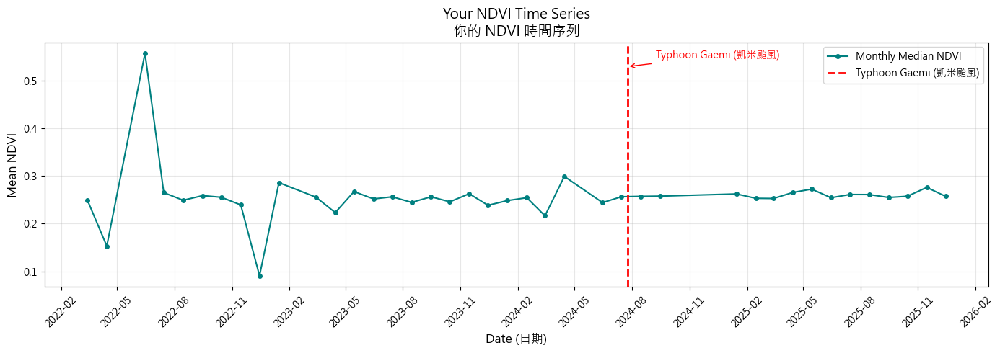


  Total months with data: 40


In [19]:
# ============================================================
# S10 — Step 2: Build & Plot Your Time Series
# ============================================================

my_s2 = (ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')
         .filterDate(MY_START, MY_END)
         .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 40))
         .filterBounds(my_aoi))

def my_mask_and_index(image):
    scl = image.select('SCL')
    good = scl.eq(4).Or(scl.eq(5)).Or(scl.eq(6)).Or(scl.eq(7))
    idx = image.normalizedDifference(my_index_bands).rename(my_index_name)
    return (image.addBands(idx)
            .updateMask(good)
            .copyProperties(image, ['system:time_start']))

my_idx_col = my_s2.map(my_mask_and_index)

print(f"Computing monthly {my_index_name} for your study area...")
start_y = int(MY_START[:4])
end_y = int(MY_END_INCLUSIVE[:4])
my_results = []

for year in range(start_y, end_y + 1):
    for month in range(1, 13):
        start = f'{year}-{month:02d}-01'
        end = f'{year}-{month + 1:02d}-01' if month < 12 else f'{year + 1}-01-01'
        if start > MY_END_INCLUSIVE:
            break
        monthly = my_idx_col.filterDate(start, end).select(my_index_name)
        n = monthly.size().getInfo()
        if n == 0:
            my_results.append((datetime(year, month, 15), None))
            continue
        val = monthly.median().reduceRegion(
            reducer=ee.Reducer.mean(), geometry=my_aoi,
            scale=100, maxPixels=1e8
        ).getInfo().get(my_index_name)
        my_results.append((datetime(year, month, 15), val))
        status = f'{val:.4f}' if val is not None else 'no data'
        print(f'  {start[:7]}: {my_index_name} = {status}  (n={n})')

my_dates = [d for d, v in my_results if v is not None]
my_vals  = [v for d, v in my_results if v is not None]
if not my_vals:
    raise ValueError("No valid values for the custom time series. Try a larger AOI or looser cloud filter.")

fig, ax = plt.subplots(figsize=(14, 5))
ax.plot(my_dates, my_vals, 'o-', color='teal', markersize=4, linewidth=1.5,
        label=f'Monthly Median {my_index_name}')
ax.axvline(x=pd.Timestamp(MY_EVENT_DATE), color='red', linestyle='--', linewidth=2,
           label=MY_EVENT_LABEL)
ax.annotate(MY_EVENT_LABEL,
            xy=(pd.Timestamp(MY_EVENT_DATE), max(my_vals) * 0.95),
            xytext=(pd.Timestamp(MY_EVENT_DATE) + timedelta(days=45), max(my_vals) * 0.98),
            fontsize=10, color='red',
            arrowprops=dict(arrowstyle='->', color='red'))

ax.set_xlabel('Date (日期)', fontsize=12)
ax.set_ylabel(f'Mean {my_index_name}', fontsize=12)
ax.set_title(f'Your {my_index_name} Time Series\n你的 {my_index_name} 時間序列', fontsize=14)
ax.legend(loc='best')
ax.grid(True, alpha=0.3)
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print(f"\n  Total months with data: {len(my_vals)}")

### S10 — Your Explanation (你的說明)

**1. Why this location? (為什麼選這個地點？)**

> *討論：* 我選擇**台北市中心**,因為它與花蓮的山區崩塌案例形成強烈對比。台北在一個不大的 AOI 內,就涵蓋了密集的建成地表、公園、行道樹、河岸廊帶與鄰近的丘陵。這讓它很適合用來測試:同一套 GEE 時間序列工作流程,能否從山區災害案例,轉移到都市環境監測案例。它也連結到真實的災害情境,因為台北經常受颱風、豪雨、風害與短期植生逆境影響。

**2. Why this index? (為什麼選這個指標？)**

> *討論：* 我使用 **NDVI**,因為這個問題探討的是颱風前後的都市植生狀況。NDVI 比較近紅外光與紅光的反射率,適合用於公園、河濱植生、行道樹廊帶與有林的丘陵。在密集的都市裡,平均 NDVI 預期會比山區森林低,因為建物、道路、水體與裸露地表都混入了 AOI 之中。

**3. What event did you mark? What happened? (你標記了什麼事件？)**

> *討論：* 我標記了 **2024-07-25 的凱米颱風(Typhoon Gaemi)**。目的是測試一場大型風暴,是否會在都市 NDVI 上呈現可見的變化。颱風可能破壞樹冠、折斷枝條、淹沒公園、增加河川濁度,或使植生暫時受逆境。不過,由於 AOI 是城市尺度、每月數值又是中值合成,事件訊號可能會被平滑掉 —— 除非損害在空間上夠廣泛,或一直延續到後續的影像。

**4. What does the time series reveal? (時間序列揭示了什麼？)**

> *討論：* 在排除明顯的離群月份後,台北每月 NDVI 時間序列大多落在 **0.24–0.28** 之間。在颱風前後,數值維持相當穩定:**2024-07 約 0.2564**、**2024-08 約 0.2572**、**2024-09 約 0.2576**。因此,每月的 AOI 平均值在凱米颱風後**並沒有**顯示全市尺度的劇烈植生崩潰。這並不能證明沒有局部損害;而是代表所選的 AOI 與「每月中值」這個統計量太過寬廣與平滑,無法分離出小型受損公園、行道樹廊帶,或短暫的淹水影響。

**5. One interesting or surprising finding (一個有趣或意外的發現):**

> *討論：* 台北的案例重複了與花蓮相同的方法論課題:**平均的時間序列會掩蓋局部的影響。** 颱風日期清楚標出來了,但城市尺度的 NDVI 平均值仍維持穩定。有些只有單一影像的孤立月份也要謹慎看待,因為它們反映的可能是雲遮罩、殘留霾害、季節狀況或取樣限制,而非真實的植生變化。為了改進這個分析,我會把 AOI 拆成公園、河岸廊帶、建成區與丘陵,再分類別個別比較。我也可以視研究問題,改測 NDWI 來看淹水,或測 NDBI 來看建成地變化。

---
## S9 — Reflection Questions (反思問題) ✏️ EXERCISE

以下根據分析提供完成版的回應。這些討論串連了筆記本的數值輸出、GEE 工作流程,以及前面幾週的本地分析。

---

**Q1: How many Sentinel-2 images did GEE process in this notebook? If each image
is approximately 800 MB, how long would it take to download them all on a 50 Mbps
connection?**

> *討論：* S2 篩選步驟在套用日期範圍、空間範圍與雲量過濾後,為花蓮 AOI 處理了 **143 張 Sentinel-2 影像**。若每張影像約 **800 MB**,總下載量為 **143 × 800 MB = 114,400 MB**,在尚未計入中繼資料與檔案系統額外負擔前,約為 **114.4 GB**。
>
> **50 Mbps** 的連線等於 **6.25 MB/s**(因為 8 bits = 1 byte)。理想的下載時間為 **114,400 / 6.25 = 18,304 秒**,約 **305 分鐘 = 5.1 小時**。實際上會更久,因為有伺服器限制、網路不穩定、檔案額外負擔與磁碟寫入速度。這正說明了 GEE 的優勢:筆記本把分析指令送到雲端,GEE 在資料典藏庫旁邊就近運算,而不是逼使用者先下載數百張大型影像。

---

**Q2: How does the median composite approach (S5) improve upon W9's two-scene
change detection? What are the advantages of using many images vs. just two?**

> *討論：* 兩張影像的比較很簡單,但很脆弱。如果其中任一張含有雲、雲影、霾、異常含水量、季節性植生差異、偏離天底(off-nadir)效應或大氣假影,相減就可能把雜訊誤判為變化。它也高度依賴確切的取得日期;單一張震前與單一張震後影像,不一定能代表典型狀況。
>
> S5 的**中值合成**做法較為穩健,因為它在每一期使用多張影像,並逐像元計算中值。隨機的雲、薄霾、陰影與一次性的離群值,較不容易主導合成結果。這建立了較穩定的震前基線,以及較具代表性的震後影像。其代價是:中值合成可能把短暫事件平滑掉,而所選的日期視窗仍然重要。對崩塌製圖而言,這是一個有用的折衷,因為持久的疤痕與植生損失仍會保留可見,同時大部分雜訊被降低。

---

**Q3: What can GEE NOT do that local analysis (W8-W12) can? Think about
specialized algorithms, custom models, and data types.**

> *討論：* GEE 在典藏庫搜尋、篩選、雲遮罩、合成、影像代數、時間序列縮減與大範圍匯出上都很強大。然而,它並不能完全取代本地分析。本地的 Python/R/QGIS 工作流程可以使用任何套件、自訂的機器學習管線、私有資料集與互動式除錯流程。例如,W12 式的隨機森林訓練,在本地可以擴充自訂的特徵工程、交叉驗證、混淆矩陣、超參數調校、模型解釋與現地標記整合。
>
> GEE 對進階 SAR 工作流程也有限制。本筆記本使用的是 Sentinel-1 GRD 後向散射,但研究等級的 InSAR 或形變分析,通常需要 SLC 相位資料、精確的影像套合、干涉圖生成、濾波、相位解纏與大氣校正。這些步驟更適合用專門的本地或專用 InSAR 軟體處理。最佳的工作流程是**混合式**的:用 GEE 做雲端尺度的前處理與初篩,匯出關鍵產品(例如 ΔNDVI GeoTIFF),再用本地工具做專門的建模、驗證、視覺化與報告。

---

**Q4: If you exported the delta_NDVI GeoTIFF from S8 and fed it into W12's
Random Forest classifier as a feature, what would you expect? Would it improve
classification accuracy for earthquake damage? Why or why not?**

> *討論：* 我會預期 `delta_NDVI` 能改善地震損害的分類,因為它直接衡量震前與震後之間的植生損失。崩塌疤痕、裸露土壤與受損坡面通常呈現強烈的負值 ΔNDVI,因此這個特徵能提供隨機森林一個「單張震後影像」無法提供的資訊,應該有助於區分穩定森林與新近擾動的地表。
>
> 不過,`delta_NDVI` 不應單獨使用。負向的 NDVI 變化也可能來自季節性植生差異、河道泥砂、農作物收割、雲/影殘留、工程開挖或水位變化。一個更強的隨機森林模型,會把 `delta_NDVI` 與震後 NDVI、RGB/SWIR 反射率、Sentinel-1 的 `delta_VV`、坡度、高程、坡向、到河流/道路的距離,以及可靠的訓練標記結合起來。我會用驗證樣本與混淆矩陣來評估分類器,因為視覺上的吻合不一定代表分類精度較高。簡言之,`delta_NDVI` 很有價值,但它最適合作為一個**多特徵、經過驗證**的損害製圖流程的一部分。

---

---
## Notebook Complete

This completed notebook demonstrates the full GEE cloud-analysis workflow:

```
S1: Setup -> S2: Filter S2 -> S3: Cloud Mask + NDVI -> S4: Time Series
    -> S5: Pre/Post NDVI -> S5b: Value Maps + GIF -> S6: SAR Time Series
    -> S7: Cross-Reference -> S8: Export -> S10: Creative Exploration -> S9: Reflection
```

**Key takeaway (核心收穫):**
GEE processes hundreds of satellite images on the server — no bulk download required.
S5b adds static value maps and GIF animations, so the results include raster-scale remote-sensing products rather than only line charts. The interpretation also shows why careful statistics matter: regional averages can hide localized damage, median composites reduce noise, and optical/SAR fusion provides more defensible disaster evidence than either sensor alone.

> *Completed notebook with expanded discussion answers, executed outputs, value maps, GIFs, and successful GEE exports.*